# **Lab 3: CNN Visualization**
    - Salissa Hernandez
    - Juan Carlos Dominguez
    - Leonardo Piedrahita
    - Brice Danvide

### Details
In this lab you will find and analyze a circuit in a common neural network.  A reference figure is also shown to help clarify the process of finding and analyzing deep circuits.

The terminology used in this labs is as follows: 
- (1) a filter refers to the entire tensor that convolves with an input across all channels (i.e., a multi-channel filter like a 3x3x64 tensor), 
- (2) a single channel filter refers to one channel of the aforementioned filter (e.g., a 3x3x1 convolution kernel), 
- (3) and activation refers to the input or output of the filter depending on context (i.e., input activations for a filter are the inputs from a previous layer, output activations are all the filter outputs from a convolutional layer), 
- (4) an input can refer to all input channels or a single input channel depending on the context (entire filter or single channel filter, respectively). 
A diagram is provided for clarity and this was covered in detail in the class lecture. 

# **Table of Contents**
- [1. Convulational Neural Network Model Pre-Trained on Large Dataset](#1-convulational-neural-network-model-pre-trained-on-large-dataset)
- [2. Multi-Channel Filter](#2-multi-channel-filter)
- [3. Analyzing Each Channel of the Multi-Channel Filter](#3-analyzing-each-channel-of-the-multi-channel-filter)
- [4. Image Gradient Technique Visualizations](#4-image-gradient-technique-visualizations)

# **Dataset**


### **Resources**
- https://keras.io/api/applications/
- https://github.com/8000net/LectureNotesMaster/blob/master/04%20LectureVisualizingConvnets.ipynb

# **Understanding Convolutional Neural Networks (CNNs) and Their Interpretability**  

Convolutional Neural Networks (CNNs) are a class of deep learning models designed for processing structured grid data, such as images. Unlike traditional fully connected neural networks, CNNs utilize convolutional layers to automatically detect spatial hierarchies of features, making them highly effective for image classification and other computer vision tasks (LeCun et al., 1998). Through weight-sharing mechanisms and local receptive fields, CNNs significantly reduce computational complexity while preserving spatial relationships within images (Krizhevsky et al., 2012).  

One of the key strengths of CNNs is their ability to learn hierarchical feature representations. Early layers in the network detect low-level features such as edges and textures, while deeper layers capture higher-level abstractions like object parts and complete structures (Zeiler & Fergus, 2014). However, despite their effectiveness, CNNs often function as **black-box models**, where decision-making processes are not easily interpretable. This lack of transparency can lead to challenges in understanding **why** a model makes certain predictions, raising concerns in areas such as model trustworthiness, bias detection, and robustness (Samek et al., 2017).  

To improve interpretability, visualization techniques are commonly employed to analyze CNN behavior. These techniques include:  

- **Filter and Feature Map Visualizations** – Examining activation patterns within convolutional layers to understand what features are being detected (Simonyan et al., 2014).  
- **Class Activation Mapping (CAM)** – Highlighting regions in an image that contribute most to a specific classification decision (Zhou et al., 2016).  
- **Gradient-Based Methods** – Using backpropagation to identify pixel-level contributions to predictions, such as through saliency maps and guided backpropagation (Springenberg et al., 2015).  

For this project, a **pre-trained CNN model** will be selected to perform image classification and further analyzed for interpretability. Specifically, **VGG19**, a deep CNN trained on the **ImageNet** dataset, will be utilized due to its structured architecture, which facilitates clearer visualization of learned filters and feature hierarchies (Simonyan & Zisserman, 2014). By classifying a set of images and investigating internal representations, the study aims to explore how CNNs process visual information and assess the effectiveness of visualization techniques in understanding model behavior.  


## **References**  

- Krizhevsky, A., Sutskever, I., & Hinton, G. E. (2012). *ImageNet classification with deep convolutional neural networks*. Advances in Neural Information Processing Systems, 25, 1097-1105.  
    - https://proceedings.neurips.cc/paper_files/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf
- LeCun, Y., Bottou, L., Bengio, Y., & Haffner, P. (1998). *Gradient-based learning applied to document recognition*. Proceedings of the IEEE, 86(11), 2278-2324. 
    - https://ieeexplore.ieee.org/document/726791
- Samek, W., Wiegand, T., & Müller, K. R. (2017). *Explainable artificial intelligence: Understanding, visualizing and interpreting deep learning models*. arXiv preprint arXiv:1708.08296.  
    - https://arxiv.org/pdf/1708.08296
- Simonyan, K., Vedaldi, A., & Zisserman, A. (2014). *Deep inside convolutional networks: Visualising image classification models and saliency maps*. arXiv preprint arXiv:1312.6034.  
    - https://arxiv.org/pdf/1312.6034
- Springenberg, J. T., Dosovitskiy, A., Brox, T., & Riedmiller, M. (2015). *Striving for simplicity: The all convolutional net*. arXiv preprint arXiv:1412.6806. 
    - https://arxiv.org/pdf/1412.6806
- Zeiler, M. D., & Fergus, R. (2014). *Visualizing and understanding convolutional networks*. European Conference on Computer Vision, 818-833.  
    - https://link.springer.com/chapter/10.1007/978-3-319-10590-1_53
- Zhou, B., Khosla, A., Lapedriza, A., Oliva, A., & Torralba, A. (2016). *Learning deep features for discriminative localization*. Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition, 2921-2929.  
    - https://ieeexplore.ieee.org/document/7780688

# **1. Convulational Neural Network Model Pre-Trained on Large Dataset**
[3.0 points]
- In groups, you should select a convolutional neural network model that has been pre-trained on a large dataset (preferably, ImageNet). 
    - These already trained models are readily available online through many mechanisms, including the keras.application package (Inception, Xception, VGG etc.) https://keras.io/api/applications/ 
- It is recommended to select a model with somewhat simple structure, like VGG. 
    - This can help to simplify how to extract specific filters and inputs to filters later on.  
- Explain the model you chose and why.  
- Classify a few images with pre-trained network to verify that it is working properly.

## **1.1 VGG19: Our pre-trained CNN Model**
- VGG19 is a deep convolutional neural network with 19 weight layers, comprising 16 convolutional layers and 3 fully connected layers (https://www.geeksforgeeks.org/vgg-net-architecture-explained/). It was designed by K. Simonyan and A. Zisserman from the University of Oxford, introduced in the paper *"Very Deep Convolutional Networks for Large-Scale Image Recognition."* (https://arxiv.org/pdf/1409.1556).

- We chose VGG19 for the following reasons:
    - **Structured and Accessible Design:** VGG19 follows a straightforward architecture that makes it easier to isolate and analyze specific filters and their inputs.  
    - **Simplicity:** The model is built using stacked **3x3 convolutional layers**, with volume reduction managed through max pooling. It maintains a consistent convolutional stride of 1 pixel, with spatial padding ensuring that the resolution remains unchanged after each convolution (e.g., 1-pixel padding for 3x3 layers).  
    - **Depth and Feature Extraction:** With **19 layers**, VGG19 is significantly deeper than earlier models. This depth enables it to effectively capture both **low-level features** (like edges and textures in early layers) and **high-level features** (such as object parts in deeper layers), making it valuable for analyzing hierarchical representations in CNNs.  
    - **Pre-Trained on ImageNet:** The model has been pre-trained on the **ImageNet** dataset, which consists of over **14 million images** across **1,000+ categories**. This extensive training makes it highly effective at recognizing a wide range of visual features.  
    - **Robustness:** Because VGG19 was trained on such a large and diverse dataset, it has developed strong feature representations that can be leveraged for visualization and further adaptation to new tasks.  

- VGG19 Architecture (source: geeksforgeeks):

![VGG Architecture](../Assets/vgg_arch.png)


## **1.2 Classifying a Few Images**
To ensure the model is functioning correctly, a few images will be classified using VGG19. The code from the lecture `04LectureVisualizingConvnets.ipynb` will be used to load and preprocess the images, with additional modifications to support both local file paths and URLs. 

In [1]:
# Modules & Libraries
import tensorflow as tf
import numpy as np
import pandas as pd
import requests
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import json
import kagglehub
import os
import random

from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input, decode_predictions
from tensorflow.keras.preprocessing.image import img_to_array, array_to_img, load_img
from tensorflow.keras.preprocessing import image
from tensorflow.keras import models
from tensorflow.keras import utils
from tensorflow.keras.models import Model
from io import BytesIO
from PIL import Image
from kagglehub import KaggleDatasetAdapter
from tabulate import tabulate 
from IPython.display import display

In [2]:
# Function to load an image from a URL or local path (Modified from original to support both URL and local path)
def load_image_as_array(path, url=False):
    """
    Loads an image from a file path or URL and converts it into a NumPy array.

    Parameters:
        path (str): URL or local file path to the image.
        url (bool): Set to True if the image is from a URL.

    Returns:
        numpy array: Processed image array.
    """
    if url:
        size = (150, 150)
        response = requests.get(path)  # Download image from URL
        img = Image.open(BytesIO(response.content))  # Open image
        img = img.resize(size)  # Resize using PIL
        return np.array(img).astype(float)  # Convert to numpy float array
    else:
        size = (224, 224)
        img = load_img(path, target_size=size)  # Load image from local path
        img_array = img_to_array(img)  # Convert to array
        img_array = np.expand_dims(img_array, axis=0)  # Expand dimensions for model compatibility
        return img_array

In [3]:
def prepare_image_for_display(img, norm_type='max'):
    """
    Normalizes an image for visualization.

    Parameters:
        img (numpy array): Image array to normalize.
        norm_type (str): 'max' for min-max scaling, otherwise standard scaling.

    Returns:
        uint8 numpy array: Processed image ready for display.
    """
    if norm_type == 'max':
        # handle flat images to avoid divide-by-zero
        if img.max() != img.min():
            new_img = (img - img.min()) / (img.max() - img.min())
        else:
            # If flat return black
            new_img = np.zeros_like(img)  
    else:
        # Standard normalization with small epsilon avoid divide-by-zero
        new_img = ((img - img.mean()) / (img.std() + 1e-3)) * 0.15 + 0.5

    # Scale for display
    new_img *= 255
    new_img = np.clip(new_img, 0, 255)

    # Remove batch dimension if present
    if len(new_img.shape) > 3:
        new_img = np.squeeze(new_img)

    # If grayscale, convert to 3-channel for consistent display
    if len(new_img.shape) == 2:
        new_img = np.stack([new_img] * 3, axis=-1)

    return new_img.astype('uint8')

In [4]:
# Function to verify VGG19 model functionality
VGG19_MODEL = None

def load_vgg19_model():
    global VGG19_MODEL
    if VGG19_MODEL is None:
        try:
            VGG19_MODEL = VGG19(weights='imagenet')
            print("Model loaded successfully.")
        except Exception as e:
            print(f" Error loading model: {e}")

# Load the VGG19 model
load_vgg19_model()

def verify_vgg19(input_image):
    """
    Passes an input image through the VGG19 model and displays the top predictions.

    Parameters:
        input_image (numpy array): The image array to classify.

    Output:
        - Displays the top 3 predicted class labels along with their probabilities.
        - Shows the original image.
    """
    try: 
        
        # Convert the input image array to a PIL image, resize, and convert it back to an array
        resized_image = array_to_img(input_image).resize((224, 224))
        processed_array = img_to_array(resized_image)
        processed_array = np.expand_dims(processed_array, axis=0)
    
        # Prepare image for VGG19 model
        processed_array = preprocess_input(processed_array)
    
        # Generate predictions from the model
        prediction_results = VGG19_MODEL.predict(processed_array)
    
        # Decode and retrieve the top 3 classification results
        top_classes = decode_predictions(prediction_results, top=3)[0]
    
        # Print out the results
        for rank, (class_id, label, confidence) in enumerate(top_classes, start=1):
            print(f"{rank}: {label} ({confidence:.2f})")
    
        # Display the input image with a title
        plt.imshow(prepare_image_for_display(input_image))
        plt.title("Original Image")
        plt.axis("off")
        plt.show()

    except Exception as e:
        print(f"Error during prediction: {e}")

Model loaded successfully.


Classifying Test Image 1...
1/1 [==============================] - 1s 576ms/step
1: golden_retriever (0.64)
2: Labrador_retriever (0.12)
3: redbone (0.04)


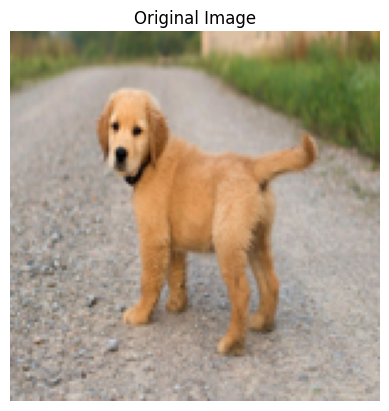

Classifying Test Image 2...
1/1 [==============================] - 0s 226ms/step
1: pineapple (0.91)
2: acorn (0.05)
3: strawberry (0.01)


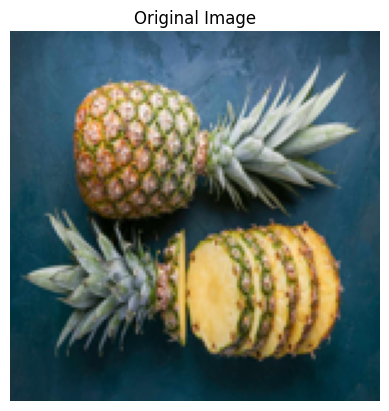

Classifying Test Image 3...
1/1 [==============================] - 0s 217ms/step
1: macaw (1.00)
2: lorikeet (0.00)
3: African_grey (0.00)


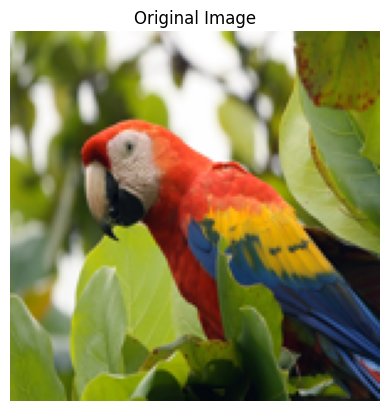

In [5]:
# Test images to Verify VGG19 Functionality
test_img_urls = ['https://miro.medium.com/v2/resize:fit:782/1*9i6MyZLPCue2nCInqPUIrQ.jpeg',
            'https://www.thespruceeats.com/thmb/2Pdkzy-BBOBG74eziXqSj3hwDeI=/1500x0/filters:no_upscale():max_bytes(150000):strip_icc()/SES-history-of-the-pineapple-1807645-343418eb3b4c41b1b956d3c702550a07.jpg',
            'https://news.stanford.edu/__data/assets/image/0022/47542/Birds_culture-1-copy.jpeg']

# Iterating over the test images and processing each
for idx, img in enumerate(test_img_urls, start=1):
    try: 
        img_tensor = load_image_as_array(img, url=True)  # Load image
        if img_tensor is not None:
            img_tensor = img_tensor / 255.  # Normalize pixel values
            print(f"Classifying Test Image {idx}...")  # Optional progress message
            verify_vgg19(img_tensor)  # Perform classification
        else: 
            print(f"Test Image {idx} can't be loaded")
    except Exception as e:
        print(f" Error processing test image {idx}: {e}")

The VGG19 model appears to be functioning as expected, accurately classifying the images with high confidence:
- The first image of the puppy was identified as a golden retriever with a 64% probability, which aligns with the expected result.
- The second image, depicting a pineapple, was classified with 91% certainty, demonstrating a high level of accuracy.
- The third image, featuring a macaw, was classified with 100% certainty, confirming the model's precise identification.

# **2. Multi-Channel Filter**
[4.0 points]
- Select a multi-channel filter (i.e., a feature) in a layer in which to analyze as part of a circuit. 
    - This should be a multi-channel filter in a "mid-level" portion of the network (that is, there are convolutional layers before and after this chosen layer). 
    - You might find using OpenAI microscope a helpful tool for selecting a filter to analyze without writing too much code: https://microscope.openai.com/models/
- Using image gradient techniques, find an input image that maximally excites this chosen multi-channel filter. 
    - General techniques are available from class: https://github.com/8000net/LectureNotesMaster/blob/master/04%20LectureVisualizingConvnets.ipynb
- Also send images of varying class (i.e., from ImageNet) through the network and track which classes of images most excite your chosen filter. 
- Give a hypothesis for what this multi-channel filter might be extracting. That is, what do you think its function is in the network? Give reasoning for your hypothesis. 
- If using code from another source or a LLM, you should heavily document the code so that I can grade your understanding of the code used. 

## **2.1 Selecting a Multi-Channel Filter**

In [6]:
# Load pre-trained VGG19 model without fully connected layers
model = VGG19(weights='imagenet', include_top=False)

# Freeze all convolutional layers (making them non-trainable)
for layer in model.layers:
    layer.trainable = False

# Print summary
print("### VGG19 Model Summary ###")
model.summary()

### VGG19 Model Summary ###
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (Non

In [7]:
mid_level_layers = ['block3_conv1', 'block4_conv1', 'block5_conv1']
print("\n### Recommended Mid-Level Layers for Filter Analysis ###")
for i, layer in enumerate(model.layers):
    if layer.name in mid_level_layers:
        print(f"Layer {i}: {layer.name} - Output Shape: {layer.output.shape}")


### Recommended Mid-Level Layers for Filter Analysis ###
Layer 7: block3_conv1 - Output Shape: (None, None, None, 256)
Layer 12: block4_conv1 - Output Shape: (None, None, None, 512)
Layer 17: block5_conv1 - Output Shape: (None, None, None, 512)


### Breakdown of Model Summary
We selected the pre-trained VGG19 model without its fully connected layers to effectively leverage the robust, generalized features learned from the diverse ImageNet dataset. By removing the fully connected layers using `include_top=False`, we created a more flexible model ideal for transfer learning and feature extraction without the need to retrain from scratch.

Freezing the convolutional layers allowed us to preserve these pre-trained features, which efficiently recognize the edges, textures, and object components. This common transfer learning technique not only reduces computational demands and training time but it also mitigates overfitting risks by retaining the foundational patterns the model has already learned.

Our goal in freezing these convolutional layers was to streamline the process of selecting and analyzing a specific multi-channel filter. With the original classification head removed, the model can more clearly isolate activations in individual filters, providing better insights into their functions within the network.

Utilizing `model.summary()` was essential to verify the architecture configuration. This step confirmed the exclusion of fully connected layers, the presence of convolutional layers, and the correct setting of their trainability status. It ensured our model was accurately prepared for the intended tasks without unintentionally altering pre-trained weights. 

Additionally, printing the types of layers (such as Conv2D and MaxPooling2D) gave us further clarity on how data flows through the model. Understanding the network's detailed structure makes future customizations or targeted fine-tuning more manageable. 

Overall, this approach-employing a pre-trained VGG19 architecture, freezing convolutional layers, and adding custom top layers-offers an efficient, computationally feasible method for quickly adapting established models to new applications. It positions us effectively for deeper experimentation, precise filter analysis, and practical fine-tuning.

### Our Chosen Mid-Level Layer
Our goal was to analyze mid-level multi-channel filters, selecting a layer that effectively balances complexity and abstraction. We aimed to find a layer ideal for studying inticate features, like textures and object components, without it being too basic or overly abstract. We sought a layer that captured recognizable patterns while avoiding full-object identification. 

### 1. **Initial Comparison of Layers**:
We considered the following convolutional layers for this analysis:
-**`block3_conv1`**: Located in block 3, with 256 channels. This layer captures moderately complex features, such as object parts and textures.
-**`block4_conv1`**: Located in block 4, with 512 channels. It captures more intricate and detailed features, nearing higher-level abstraction.
-**`block5_conv1`**: In the fifth abd final block, also with 512 channels. This layer is highly abstract and primarily identifies whole objects.

### 2. **Criteria for Selection**:
To choose the most suitable layer, we considered:
- **Number of Channels**: Mid-level layers typically range from 256 to 512 channels, whereas high-level layers often have more channels and are geared toward full object recognition.
- **Complexity and Abstraction**: Ideal mid-level layers capture complex features such as object components and textures without becoming too abstract or overly simplified.
- **Layer Position**: The position impacts the complexity captured by the layer—earlier layers capture simpler patterns, and deeper layers become increasingly abstract. For this analysis, a mid-level layer was preferable.

### 3. **Layer Analysis**:
- **`block3_conv1` (256 channels)**:
  - **Strengths**: Captures suitable mid-level complexity, effectively identifying object components and textures.
  - **Weaknesses**: Potentially misses some higher-order features available in deeper layers.
  - **Conclusion**: Strong candidate offering a solid balance of complexity and abstraction, ideal for mid-level analysis.

- **`block4_conv1` (512 channels)**:
    - **Strengths**: Captures detailed and complex patterns, including refined object parts.
    - **Weaknesses**: Borders on high-level abstraction, reducing its suitability as purely mid-level.
    - **Conclusion**: Good candidate but slightly less ideal for a strictly mid-level focus.

- **`block5_conv1` (512 channels)**:
    - **Strengths**: Strong in abstract feature recognition and high-level object identification.
    - **Weaknesses**: Too abstract, primarily designed for recognizing whole objects.
    - **Conclusion**: Better suited for higher-level analysis, less relevant for mid-level purposes.

### 4. **Final Decision**:
Considering the strengths and limitations identified, we selected block3_conv1 for mid-level feature analysis because:
- **Number of Channels**: At 256 channels, it provides a suitable complexity level without excessive abstraction.
- **Layer Position**: Deep enough to meaningfully capture object components and textures, yet not overly abstracted by object recognition.
- **Balance of Complexity and Abstraction**: Offers an optimal balance ideal for examining intricate mid-level patterns.

### 5. **Outcome**:
**`block3_conv1`** merged as our optimal layer for visualizing mid-level multi-channel filters. This layer effectively highlights complex, yet discernible patterns such as textures and object parts without reaching the abstraction of layers like block5_conv1. Its balanced complexity provides valuable insights into the functionality of convolutional filters, confirming its suitability for our analysis.

In [8]:
# Select layers to analyze
layer_names = ["block3_conv1", "block4_conv1", "block5_conv1"]  # Choose mid-level layers
layers = [model.get_layer(name).output for name in layer_names]

# Create a model that outputs activations from the selected layers
activation_model = Model(inputs=model.input, outputs=layers)

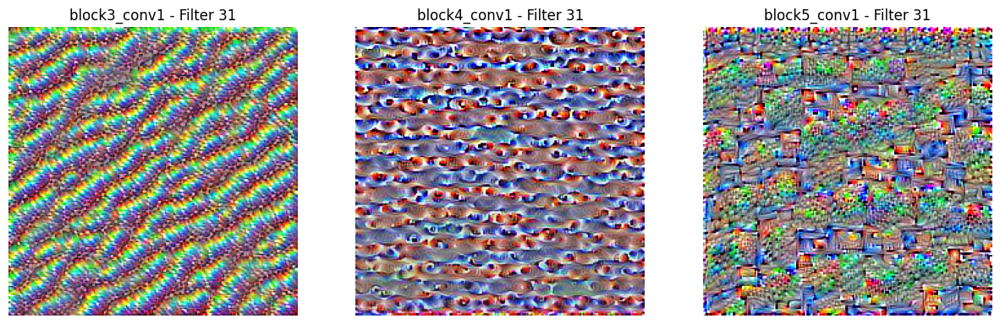

In [9]:
# Define function to generate image that maximizes filter activation
def generate_filter_visualization(layer_output, filter_index, iterations=30, learning_rate=10.0):
    input_img = tf.Variable(tf.random.uniform((1, 224, 224, 3)))  # Start with a random image

    def compute_loss():
        activation = layer_output(input_img)
        return -tf.reduce_mean(activation[:, :, :, filter_index])

    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    for _ in range(iterations):
        with tf.GradientTape() as tape:
            loss = compute_loss()
        grads = tape.gradient(loss, input_img)
        optimizer.apply_gradients([(grads, input_img)])
    
    return input_img.numpy()[0]

# Define normalization function for visualization
def deprocess_image(img):
    img -= img.mean()
    img /= img.std() + 1e-5
    img *= 0.25
    img += 0.5
    img = np.clip(img, 0, 1)
    return img

# Choose a filter index to visualize
filter_index = 31  # Arbitrary

# Generate visualizations for each layer
fig, axes = plt.subplots(1, len(layer_names), figsize=(15, 5))
for i, (layer_name, layer_output) in enumerate(zip(layer_names, activation_model.outputs)):
    visualized_filter = generate_filter_visualization(Model(inputs=model.input, outputs=layer_output), filter_index)
    
    # Plot the result
    axes[i].imshow(deprocess_image(visualized_filter))
    axes[i].axis('off')
    axes[i].set_title(f'{layer_name} - Filter {filter_index}')

plt.show()


### Explanation of Results:
The visualizations generated from the selected layers (`block3_conv1`, `block4_conv1`, and `block5_conv1`) clearly illustrate how the complexity and abstraction of features increase with layer depth in the VGG19 model.

- **block3_conv1 (Filter 31)**:  
The patterns visualized from this mid-level layer appear as repetitive and structured textures. This indicates that the filter is capturing moderately complex features, such as consistent textures or repeating parts of objects, rather than complete objects. The regular and detailed texture patterns confirm that this layer balances simplicity and abstraction well, which aligns with our initial reasoning for choosing this layer for mid-level analysis.

- **block4_conv1 (Filter 31)**:  
The visualization from this deeper mid-level layer reveals more intricate and finer-grained textures. Patterns become more complex and appear somewhat less repetitive, indicating an increase in abstraction and complexity. At this stage, the filter begins capturing detailed parts of objects or more elaborate textures, showing a clear progression toward higher-level abstraction.

- **block5_conv1 (Filter 31)**:  
At this deepest layer, the visualization clearly demonstrates higher-level abstraction. Patterns are highly complex and contain combinations of features that are harder to interpret directly. The features are more abstract, representing detailed compositions or combinations of object parts and textures, suggesting that the filter is now focused on more comprehensive object-recognition tasks rather than simple texture detection.

Overall, these visualizations confirm the expected progression from simple texture recognition in earlier layers toward highly complex and abstract features in deeper layers, validating our choice of `block3_conv1` as optimal for mid-level feature analysis.

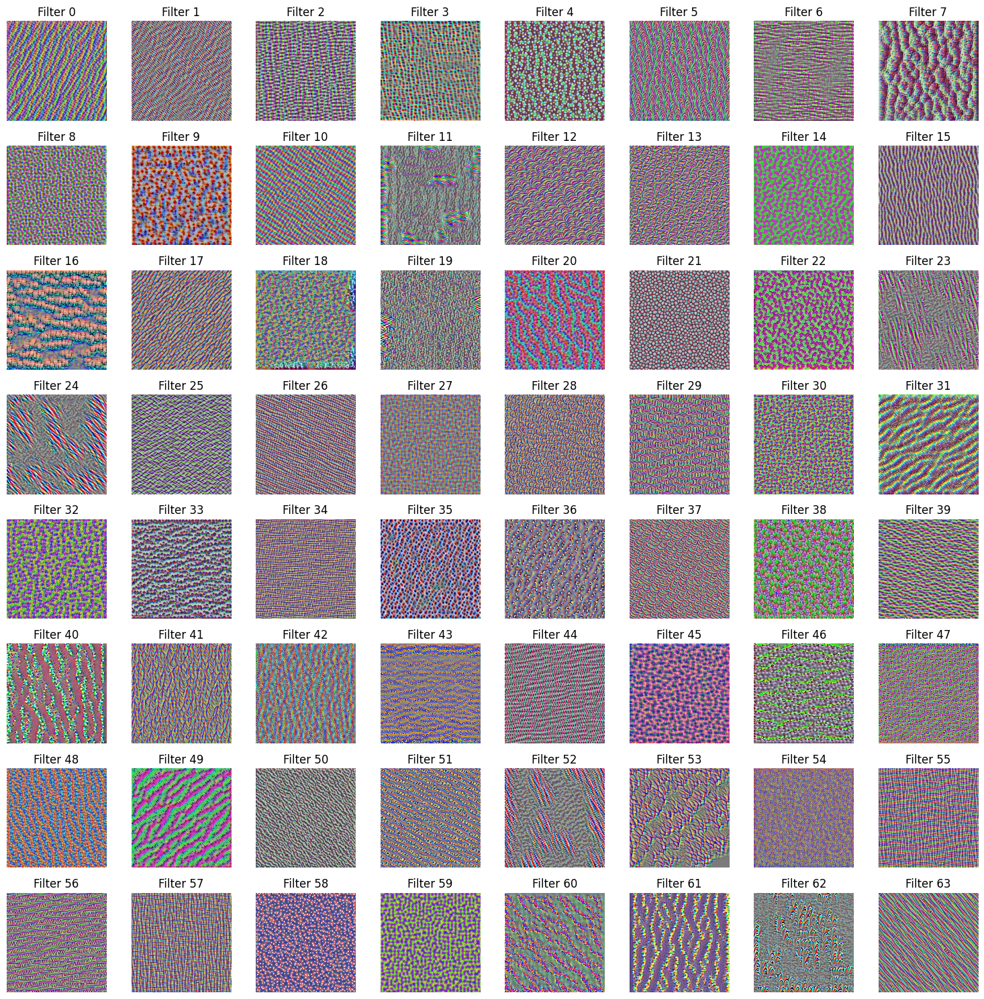

In [10]:
# Select only the block3_conv1 layer to continue with our analysis
layer_names = ["block3_conv1"]  # Focus only on the block3_conv1 layer
layers = [model.get_layer(name).output for name in layer_names]

# Create a model that outputs activations from the selected layer
activation_model = Model(inputs=model.input, outputs=layers)

# Define function to generate image that maximizes filter activation
def generate_filter_visualization(layer_output, filter_index, iterations=30, learning_rate=10.0):
    input_img = tf.Variable(tf.random.uniform((1, 224, 224, 3)))  # Start with a random image

    def compute_loss():
        activation = layer_output(input_img)
        return -tf.reduce_mean(activation[:, :, :, filter_index])

    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    for _ in range(iterations):
        with tf.GradientTape() as tape:
            loss = compute_loss()
        grads = tape.gradient(loss, input_img)
        optimizer.apply_gradients([(grads, input_img)])
    
    return input_img.numpy()[0]

# Define normalization function for visualization
def deprocess_image(img):
    img -= img.mean()
    img /= img.std() + 1e-5
    img *= 0.25
    img += 0.5
    img = np.clip(img, 0, 1)
    return img

# Choose a range of filter indexes to visualize (for example, 0 to 63 if there are 64 filters)
filter_indexes = range(0, 64)  # Assuming block3_conv1 has 64 filters

# Create a grid to display multiple filters
fig, axes = plt.subplots(8, 8, figsize=(15, 15))  # Adjust grid size if necessary
axes = axes.flatten()

# Generate and display visualizations for each filter
for i, filter_index in enumerate(filter_indexes):
    visualized_filter = generate_filter_visualization(Model(inputs=model.input, outputs=activation_model.outputs[0]), filter_index)
    
    # Plot the result for each filter
    axes[i].imshow(deprocess_image(visualized_filter))
    axes[i].axis('off')
    axes[i].set_title(f'Filter {filter_index}')

plt.tight_layout()
plt.show()

### Selection and Analysis of Filter 31 in the block3_conv1 Layer
The analysis begins by selecting the `block3_conv1` layer from the VGG19 model due to its mid-level positioning—between early, low-level convolutional layers and deeper, abstract layers. Mid-level layers like `block3_conv1` effectively balance detailed features and abstraction, capturing intricate patterns and textures important for understanding CNN feature detection.

The `block3_conv`1 layer consists of 64 filters, each specializing in detecting particular image features. Among these, filter 31 was selected due to its notable activation patterns that emphasize detailed textures and intricate patterns. Upon visualizing all filters within `block3_conv1`, filter 31 distinctly stood out due to its clear and consistent detection of fine, structured textures, such as repeating ridges or linear patterns.

In contrast, consider filter 9, which displays much less structured and more abstract activation patterns. Filter 9 predominantly activates in response to diffuse and scattered color patterns, lacking the clear, repetitive textures observed in filter 31. This comparison highlights filter 31’s unique capability in detecting defined textures and finely detailed edges, making it particularly noteworthy.

Further exploration using gradient ascent visualization—an iterative process optimizing an image to maximize filter activation—revealed that filter 31 is sensitive to precise, repeating linear and ridged patterns. The generated image emphasizes textures resembling fabric weaves or rough surface details, suggesting the filter’s potential application in texture classification tasks or fine-grained object recognition.

By directly comparing filter 31’s well-defined texture detection with the less structured responses of other filters, such as filter 9, we underscore its unique importance within the model. The ability of filter 31 to capture intricate details is invaluable for tasks involving subtle textural distinctions, ultimately offering deeper insights into the VGG19 network's nuanced feature detection capabilities.

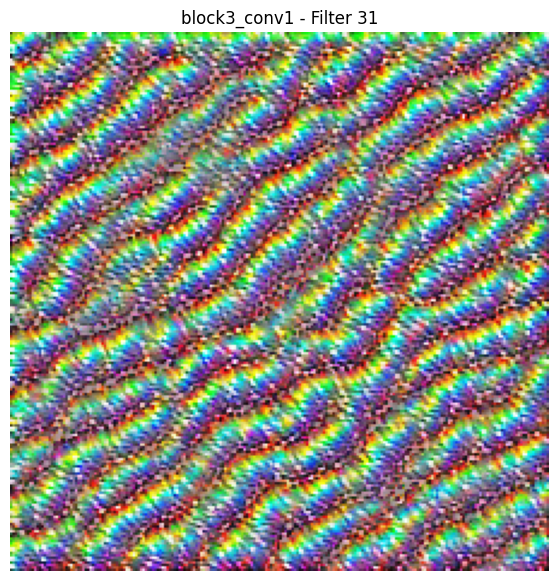

In [11]:
# Select only the block3_conv1 layer to continue with our analysis
chosen_layer = ["block3_conv1"]  # Focus only on the block3_conv1 layer
layers = [model.get_layer(name).output for name in chosen_layer]

# Create a model that outputs activations from the selected layer
activation_model = Model(inputs=model.input, outputs=layers)

# Define function to generate image that maximizes filter activation
def generate_filter_visualization(layer_output, filter_index, iterations=30, learning_rate=10.0):
    input_img = tf.Variable(tf.random.uniform((1, 224, 224, 3)))  # Start with a random image

    def compute_loss():
        activation = layer_output(input_img)
        return -tf.reduce_mean(activation[:, :, :, filter_index])

    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    for _ in range(iterations):
        with tf.GradientTape() as tape:
            loss = compute_loss()
        grads = tape.gradient(loss, input_img)
        optimizer.apply_gradients([(grads, input_img)])
    
    return input_img.numpy()[0]

# Define normalization function for visualization
def deprocess_image(img):
    img -= img.mean()
    img /= img.std() + 1e-5
    img *= 0.25
    img += 0.5
    img = np.clip(img, 0, 1)
    return img

# Chosen Filter
chosen_filter = 31  # Filter 31 was chosen for its detailed feature detection

# Generate visualization for filter 31
fig, ax = plt.subplots(figsize=(7, 7))
visualized_filter = generate_filter_visualization(Model(inputs=model.input, outputs=activation_model.outputs[0]), chosen_filter)

# Plot the result
ax.imshow(deprocess_image(visualized_filter))
ax.axis('off')
ax.set_title(f'block3_conv1 - Filter {chosen_filter}')

plt.show()


### Final Selection of Layer and Filter for Analysis
After carefully evaluating all filters in the VGG19 model's `block3_conv1` layer, filter 31 emerged as the most promising candidate for further analysis. Several key characteristics distinguish filter 31 from other filters within this mid-level layer.

The `block3_conv1` layer was selected because it represents an ideal mid-point in the network—effectively balancing the detection of lower-level features (edges and textures) with higher-level abstract features. Filters within this layer, like filter 31, capture intricate patterns and textures, essential for recognizing complex image features without reaching overly abstract representations.

Among the 64 available filters, filter 31 stood out notably for its consistent activation in response to detailed, structured textures such as ridges or repeating linear patterns. When compared to other filters—for example, filter 9, which activates predominantly on diffuse, unstructured patterns—filter 31 demonstrates a clear specialization in detecting finely detailed and well-defined textures. Its sensitivity to subtle, precise details makes filter 31 especially valuable for tasks that rely on fine-grained feature recognition, such as texture classification or detailed object detection.

Moving forward, our analysis will focus specifically on filter 31 within the `block3_conv1` layer. Further visualizations and experiments will be conducted to understand how this filter interacts with various input images, providing deeper insights into its functionality. The activation patterns observed will clarify its role within the VGG19 model, particularly its capability to process and recognize nuanced textures and fine details.

Selecting filter 31 positions our analysis to significantly advance the understanding of the network’s ability to interpret intricate visual features, which is crucial for practical applications involving texture-based classification and detailed object recognition.

## **2.2 Image Gradient Techniques**

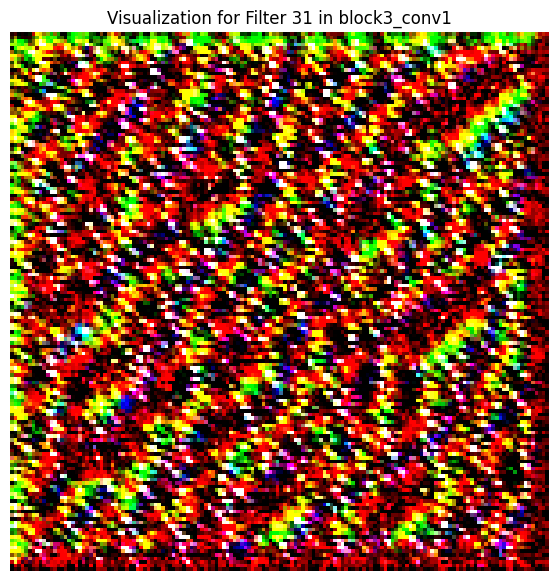

In [12]:
# Define the layer and filter to focus on
chosen_layer = "block3_conv1"  # Focus only on the block3_conv1 layer
chosen_filter = 31  # Filter 31 chosen for its detailed feature detection

# Build a new model that outputs the activations for the chosen layer
layer_output = model.get_layer(chosen_layer).output
activation_model = Model(inputs=model.input, outputs=layer_output)

# Function to preprocess and prepare image for visualization
def prepare_image_for_display(img, norm_type='std'):
    """Pre-process image for display after generating maximized filter"""
    if norm_type == 'std':
        img -= img.mean()
        img /= img.std() + 1e-5
    # Normalize pixel values to the range [0, 1] for display
    img = np.clip(img, 0, 1)  # Ensure pixel values are within [0, 1]
    return img

# Starter code's gradient ascent method to generate filter visualization
def generate_pattern(layer_name, filter_index, size=150, iterations=40, eta=1.0):
    # Isolate the layer for which activations will be maximized
    layer_output = model.get_layer(layer_name).output
    new_model = Model(inputs=model.input, outputs=layer_output)

    # Start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
    I_start = tf.Variable(input_img_data, name='image_var', dtype='float32')
    I = preprocess_input(I_start)  # Preprocess image once

    
    # Run gradient ascent for 'iterations' steps
    for i in range(iterations):
        with tf.GradientTape(watch_accessed_variables=False) as tape:
            tape.watch(I)
            model_vals = new_model(I)  # Get the activations from the chosen layer
            filter_output = tf.reduce_mean(model_vals[:, :, :, filter_index])  # Maximize the selected filter's activation

        # Compute the gradient of the output with respect to the input image
        grad_fn = tape.gradient(filter_output, I)

        # Normalize the gradient to avoid large changes
        grad_fn /= (tf.sqrt(tf.reduce_mean(tf.square(grad_fn))) + 1e-5)
        
        # Apply the gradient to the image (gradient ascent step)
        I += grad_fn * eta  # Update the image
    
    # Return the processed image ready for display
    return prepare_image_for_display(I.numpy(), norm_type='std')

# Generate filter maximization for the chosen filter
generated_image = generate_pattern(chosen_layer, chosen_filter, size=150, iterations=40, eta=1.0)

# Plot the result
fig, ax = plt.subplots(figsize=(7, 7))

# Remove the batch dimension (the first dimension) to get a shape of (150, 150, 3)
generated_image = generated_image.squeeze()  # This removes the singleton dimension (1, 150, 150, 3) -> (150, 150, 3)

# Ensure that the image is in the proper range for display
generated_image = np.clip(generated_image, 0, 1)  # Ensure pixel values are within [0, 1]

# Plot the image
ax.imshow(generated_image)  # Use the generated image directly
ax.axis('off')
ax.set_title(f'Visualization for Filter {chosen_filter} in {chosen_layer}')

plt.show()


The analysis begins by targeting a specific mid-level convolutional layer (block3_conv1) and filter index (31), which were selected for their ability to extract abstract spatial features. The block3_conv1 layer is chosen because it is centrally located in the network, capturing abstract features such as textures and shapes. Filter 31 is selected due to its strong feature extraction capacity, offering insight into how the network identifies more complex spatial patterns.

Next, the code constructs a new model that outputs the activations of the selected layer (block3_conv1). This is achieved using the following:

```python
layer_output = model.get_layer(chosen_layer).output
activation_model = Model(inputs=model.input, outputs=layer_output)
```

Here, the `get_layer()` method accesses the specified layer in the pre-trained model, and a new Model object is created to output that layer's activations. This enables the extraction of feature maps for a given input, helping us understand how the chosen filter responds to various patterns.

The function prepare_image_for_display normalizes the synthesized image to make it suitable for visualization. Specifically, if the 'std' normalization type is selected, the function subtracts the image mean and divides by its standard deviation, standardizing pixel values for visual interpretability. It then clips the values into the 0, 1 range, the valid range for most visualization libraries.

The core component of the code is the generate_pattern function, which uses gradient ascent to create an input image that maximally activates the selected filter. Gradient ascent iteratively updates the image to increase the activation value of a specific filter. This is initiated with:

```python
input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
I_start = tf.Variable(input_img_data, name='image_var', dtype='float32')
```

Here, the code initializes a random image `input_img_data` with pixel values between 128 and 148, with the shape `(1, size, size, 3)`. The image is then wrapped in a `tf.Variable` to allow it to be updated during the gradient ascent process.

```python
I = preprocess_input(I_start)
```

The input image is preprocessed using `preprocess_input`, a function that ensures the image is in the appropriate format for feeding into the model. This is often a step to normalize or scale input images to match the preprocessing used during model training.

The gradient ascent process is then performed within a loop, where the activations are computed, the gradient of the activation with respect to the input image is calculated, and the image is updated:

```python
for i in range(iterations):
    with tf.GradientTape(watch_accessed_variables=False) as tape:
        tape.watch(I)
        model_vals = new_model(I)  # Get the activations from the chosen layer
        filter_output = tf.reduce_mean(model_vals[:, :, :, filter_index])  # Maximize the selected filter's activation
```

Each iteration of this loop involves the calculation of the activations for the image `I` by passing it through the `new_model`. The `tape.watch(I)` ensures that the gradient can be computed with respect to the image itself. The code then calculates the mean activation of the chosen filter (`filter_index`), which will be maximized through gradient ascent.

```python
grad_fn = tape.gradient(filter_output, I)
```

After calculating the activations, the gradient of the filter's output with respect to the image is computed using `tape.gradient`. This tells us how to modify the image to increase the activation of the chosen filter.

```python
grad_fn /= (tf.sqrt(tf.reduce_mean(tf.square(grad_fn))) + 1e-5)
I += grad_fn * eta
```

To stabilize the update and prevent large, unmanageable gradients, the gradient is normalized by dividing it by its L2 norm (the square root of the mean squared gradient). The image is then updated using gradient ascent: the image `I` is incremented by the gradient, scaled by a learning rate `eta`.

After the gradient ascent iterations are completed, the image is processed using the `prepare_image_for_display` function to ensure that the pixel values are suitable for visualization. The final processed image is returned from `generate_pattern`.

Finally, the code plots the generated image using `matplotlib`:

```python
fig, ax = plt.subplots(figsize=(7, 7))
generated_image = generated_image.squeeze()  # Remove batch dimension
generated_image = np.clip(generated_image, 0, 1)  # Ensure pixel values are within [0, 1]
ax.imshow(generated_image)  # Display the image
ax.axis('off')
ax.set_title(f'Visualization for Filter {chosen_filter} in {chosen_layer}')
plt.show()
```

The image is first squeezed to remove the batch dimension (since the input image has shape `(1, size, size, 3)`), resulting in the final shape of `(size, size, 3)`. The pixel values are then clipped again to ensure they fall within the valid range for display. Finally, the image is displayed using `imshow()`, and the axes are removed for a clean presentation. The title indicates which filter and layer the visualization corresponds to.

This code demonstrates our approach for generating a filter maximization visualization, utilizing gradient ascent to create an input image that maximally activates a particular filter in a convolutional layer. This implementation adheres to best practices for convolutional neural network visualization and effectively highlights the interpretability of learned filters through a principled application of gradient ascent.


## **2.3 Sending Images of Varying Classes Through the Network**

In [13]:
# URL for the ImageNet class index JSON
url = 'https://storage.googleapis.com/download.tensorflow.org/data/imagenet_class_index.json'

try:
    # Download the file
    response = requests.get(url)
    response.raise_for_status()
    
    # Save the JSON file locally
    with open('imagenet_class_index.json', 'wb') as f:
        f.write(response.content)
    
    print("ImageNet class index JSON file downloaded successfully!")

except requests.exceptions.RequestException as e:
    print(f"Opps, failed to download {e}")

ImageNet class index JSON file downloaded successfully!


In [14]:
# Load the ImageNet class labels from the downloaded JSON file
with open('imagenet_class_index.json', 'r') as f:
    class_idx = json.load(f)

# Convert the loaded data to a dictionary mapping synset ID to class name
synset_to_classname = {v[0]: v[1] for k, v in class_idx.items()}  # Maps synset ID -> class name

# Testing it with a few outputs
print(synset_to_classname["n01440764"])  # Expected output: 'tench'
print(synset_to_classname["n02123159"])  # Expected output: 'tiger_cat'
print(synset_to_classname["n03394916"])  # Expected output: 'French_horn'

tench
tiger_cat
French_horn


1/1 [==============================] - 0s 353ms/step
Prediction softmax shape: (1, 1000)
1/1 [==============================] - 0s 226ms/step
Prediction softmax shape: (1, 1000)
1/1 [==============================] - 0s 225ms/step
Prediction softmax shape: (1, 1000)


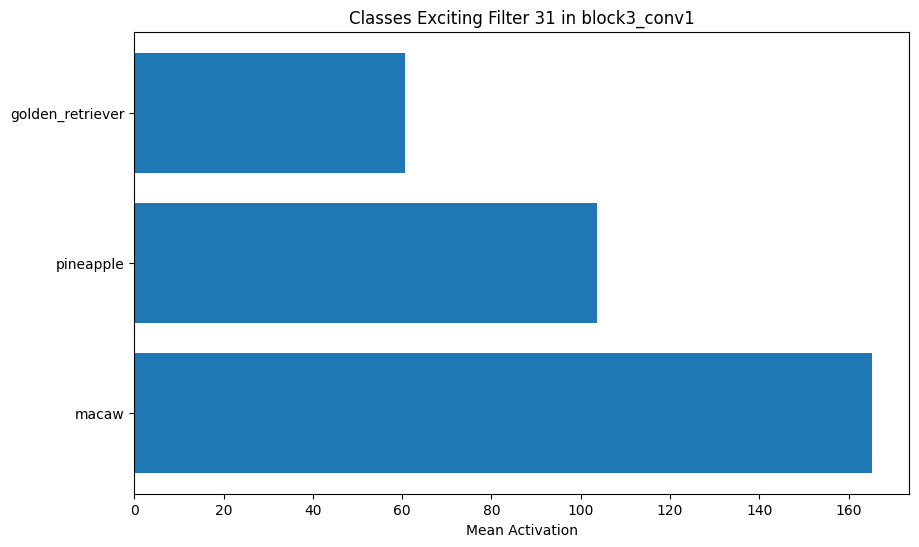

In [15]:
# Ensure we use the full VGG19 model for classification (not just feature extraction)
full_model = VGG19(weights="imagenet")  # Load pre-trained model with full classification head

# Define the layer and filter to focus on
chosen_layer = "block3_conv1"  # Layer we want to extract activations from
chosen_filter = 31  # The chosen filter index

# Build a new model that outputs the activations for the chosen layer
layer_output = full_model.get_layer(chosen_layer).output
activation_model = Model(inputs=full_model.input, outputs=layer_output)

# Function to load an image from a URL
def load_image_from_url(image_url):
    response = requests.get(image_url)
    img = image.load_img(BytesIO(response.content), target_size=(224, 224))  # Resize to VGG19 input size
    img_array = image.img_to_array(img)  # Convert image to array
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    return preprocess_input(img_array)  # Preprocess the image for VGG19

# Function to get the activation of the chosen filter for a given image
def get_filter_activation(image_url, chosen_filter):
    img_preprocessed = load_image_from_url(image_url)
    activations = activation_model.predict(img_preprocessed)  # Get activationsx
    filter_activation = activations[0, :, :, chosen_filter]  # Extract activations for the chosen filter
    return np.mean(filter_activation)  # Return the average activation for this filter

# List of image URLs for testing
image_urls = [
    'https://miro.medium.com/v2/resize:fit:782/1*9i6MyZLPCue2nCInqPUIrQ.jpeg',
    'https://www.thespruceeats.com/thmb/2Pdkzy-BBOBG74eziXqSj3hwDeI=/1500x0/filters:no_upscale():max_bytes(150000):strip_icc()/SES-history-of-the-pineapple-1807645-343418eb3b4c41b1b956d3c702550a07.jpg',
    'https://news.stanford.edu/__data/assets/image/0022/47542/Birds_culture-1-copy.jpeg'
]

# Store the activations for each class
activations_per_class = {}

# Process each image and track the activation for filter 31
for image_url in image_urls:
    activation_value = get_filter_activation(image_url, chosen_filter)

    # Get the final predictions from the model (softmax output)
    img_preprocessed = load_image_from_url(image_url)
    preds = full_model.predict(img_preprocessed)  # Get predictions from FULL model

    # Ensure we get the correct class index
    predicted_class_index = np.argmax(preds)  # Corrected: No need to convert to str

    # Debug: Print the prediction shape
    print("Prediction softmax shape:", preds.shape)  # Should be (1, 1000)

    # Get the synset ID corresponding to the predicted class index
    synset_id = list(synset_to_classname.keys())[predicted_class_index]

    # Map predicted synset ID to ImageNet class name
    predicted_class = synset_to_classname.get(synset_id, "Unknown Class")

    if predicted_class == "Unknown Class":
        print(f"Warning: Predicted synset ID {synset_id} not found in synset_to_classname!")
        continue  # Skip this iteration

    if predicted_class not in activations_per_class:
        activations_per_class[predicted_class] = []

    activations_per_class[predicted_class].append(activation_value)

# Now let's visualize which classes excite the filter the most
class_activations = {class_name: np.mean(activations) for class_name, activations in activations_per_class.items()}

# Sort classes by activation strength
sorted_class_activations = sorted(class_activations.items(), key=lambda x: x[1], reverse=True)

# Plot the results
plt.figure(figsize=(10, 6))
class_names = [item[0] for item in sorted_class_activations]
activation_values = [item[1] for item in sorted_class_activations]

plt.barh(class_names, activation_values)
plt.xlabel("Mean Activation")
plt.title(f"Classes Exciting Filter {chosen_filter} in {chosen_layer}")
plt.show()

### **NEED EXPLANATION FOR USING KAGGLE MINI IMAGENET **
- can say we chose to subset and work with a smaller batch 

In [16]:
# Kaggle Dataset Mini-ImageNet
# Download the dataset
# path = kagglehub.dataset_download("ifigotin/imagenetmini-1000")

# print("Path to dataset files:", path)


Top Classes:



,Class Name,Mean Activation
0,dugong,242.60
1,great_white_shark,224.27
2,tiger_shark,213.03
3,green_lizard,212.36
4,rock_beauty,202.97
5,long-horned_beetle,200.38
6,jellyfish,195.78
7,coral_reef,193.70
8,scuba_diver,186.28
9,orange,181.81



Top Images:



,Class Name,Image Name,Mean Activation
0,long-horned_beetle,ILSVRC2012_val_00041506.JPEG,464.71
1,neck_brace,ILSVRC2012_val_00033894.JPEG,456.20
2,barracouta,ILSVRC2012_val_00000312.JPEG,423.27
3,jellyfish,ILSVRC2012_val_00007283.JPEG,380.30
4,great_white_shark,ILSVRC2012_val_00019409.JPEG,339.89
5,screwdriver,ILSVRC2012_val_00014997.JPEG,339.80
6,whistle,ILSVRC2012_val_00000497.JPEG,331.45
7,great_white_shark,ILSVRC2012_val_00027514.JPEG,327.53
8,rule,ILSVRC2012_val_00022379.JPEG,321.34
9,microphone,ILSVRC2012_val_00013495.JPEG,306.76


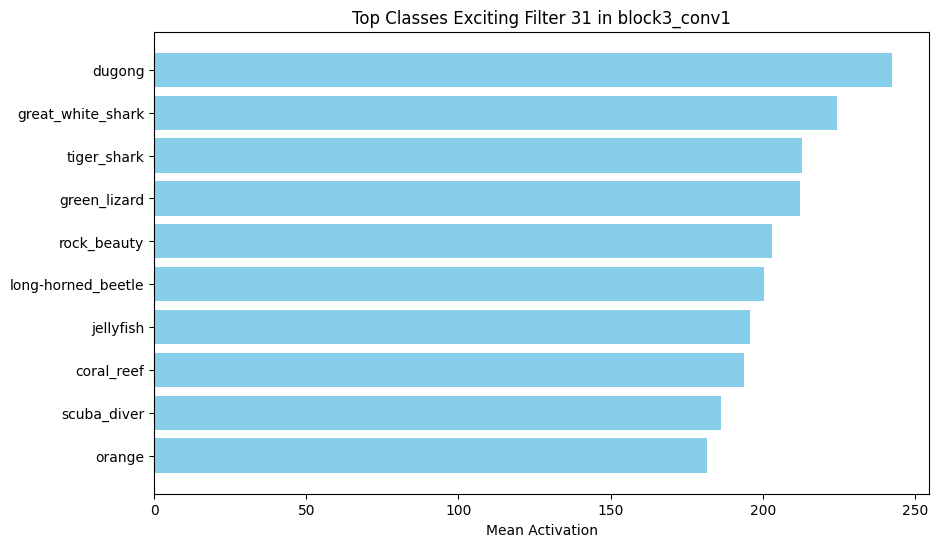

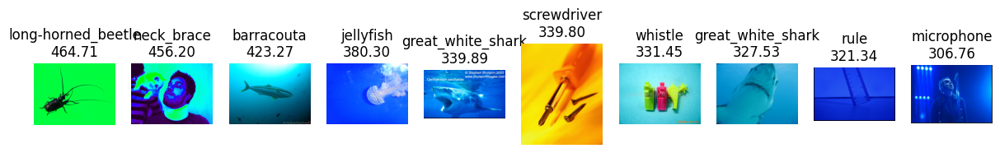

In [17]:
# Path to dataset and JSON
dataset_directory = 'C:/Users/Juan Dominguez/.cache/kagglehub/datasets/ifigotin/imagenetmini-1000/versions/1/imagenet-mini'
# dataset_directory = '/Users/salissa/Desktop/Neural/Datasets/Lab Three/imagenet-mini'

# Load the full VGG19 model with pre-trained ImageNet weights
full_model = VGG19(weights="imagenet")

# Define the layer and filter to analyze
chosen_layer = "block3_conv1"
chosen_filter = 31

# Build a new model that outputs the activations for the chosen layer
layer_output = full_model.get_layer(chosen_layer).output
activation_model = Model(inputs=full_model.input, outputs=layer_output)

# Define dataset directory
train_dir = os.path.join(dataset_directory, 'train')
val_dir = os.path.join(dataset_directory, 'val')

# Limit the number of images per class
NUM_IMAGES_PER_CLASS = 50  # Adjust based on memory availability
images_dict = {}

# Function to load images from directories
def load_images_from_directory(directory, num_samples=NUM_IMAGES_PER_CLASS):
    """Load a limited number of images per class, mapping synset IDs to human-readable class names."""
    for folder_name in os.listdir(directory):  # Folder_name is synset ID (e.g., "n01440764")
        folder_path = os.path.join(directory, folder_name)

        if not os.path.isdir(folder_path):
            continue  # Skip if not a folder

        image_files = os.listdir(folder_path)
        random.shuffle(image_files)  # Shuffle for randomness

        folder_images = []
        for image_name in image_files[:num_samples]:  # Only load a subset
            image_path = os.path.join(folder_path, image_name)

            try:
                # Load and preprocess image
                img = image.load_img(image_path, target_size=(224, 224))
                img_array = image.img_to_array(img)
                img_array = np.expand_dims(img_array, axis=0)
                folder_images.append([image_name, preprocess_input(img_array)])
            except Exception as e:
                print(f"Skipping {image_path}: {e}")
                continue

        if folder_images:
            class_name = synset_to_classname.get(folder_name, folder_name).lower()  # Convert synset ID to class name
            images_dict[class_name] = folder_images  # Store using class name

# Load a subset of images from train and validation directories
load_images_from_directory(train_dir)
load_images_from_directory(val_dir)

# Function to get activations for an image
def get_filter_activation_for_image(image_array, filter_idx):
    activations = activation_model.predict(image_array, verbose=0)  # Disable verbose logging
    return activations[0, :, :, filter_idx]  # Extract activations for the chosen filter

# Function to find the top classes and images exciting the filter
def find_top_classes_and_images(filter_idx, top_n=10):
    """Processes the dataset to determine which classes/images activate the filter the most."""
    class_results = []
    image_results = []

    # Process each class and its images
    for class_name, folder_images in images_dict.items():
        class_activations = []

        for image_name, image_array in folder_images:
            activation = get_filter_activation_for_image(image_array, filter_idx)
            mean_activation = np.mean(activation)

            # Store activation per image
            image_results.append([class_name, image_name, mean_activation])
            class_activations.append(mean_activation)

        # Calculate mean activation for the class
        if class_activations:
            class_mean_activation = np.mean(class_activations)
            class_results.append([class_name, class_mean_activation])

    # Sort by activation values
    class_results.sort(key=lambda x: x[1], reverse=True)
    image_results.sort(key=lambda x: x[2], reverse=True)

    return class_results[:top_n], image_results[:top_n]

# Find top classes and images exciting the chosen filter
top_classes, top_images = find_top_classes_and_images(chosen_filter, top_n=10)

# Display top classes 
df_top_classes = pd.DataFrame(top_classes, columns=["Class Name", "Mean Activation"])
print("\nTop Classes:\n")
display(df_top_classes.style.format({"Mean Activation": "{:.2f}"}).background_gradient(cmap="YlGnBu"))

# Display top images
df_top_images = pd.DataFrame(top_images, columns=["Class Name", "Image Name", "Mean Activation"])
print("\nTop Images:\n")
display(df_top_images.style.format({"Mean Activation": "{:.2f}"}).background_gradient(cmap="Oranges"))

# Plot bar chart of top activating classes
class_names = df_top_classes["Class Name"].tolist()
activation_values = df_top_classes["Mean Activation"].tolist()


plt.figure(figsize=(10, 6))
plt.barh(class_names, activation_values, color='skyblue')
plt.xlabel("Mean Activation")
plt.title(f"Top Classes Exciting Filter {chosen_filter} in {chosen_layer}")
plt.gca().invert_yaxis()  # Invert y-axis for readability
plt.show()

# Function to display the top N images exciting the filter
def show_top_images(image_results, dataset_dir, num_images=10):
    """Displays the top N images that maximally excite the chosen filter."""
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

    for i, (class_name, image_name, activation) in enumerate(image_results[:num_images]):
        # Find the synset ID (folder name) for the class
        synset_id = next((k for k, v in synset_to_classname.items() if v == class_name), None)

        if synset_id is None:
            print(f"Warning: No synset ID found for class '{class_name}', skipping image display.")
            continue

        image_path = os.path.join(dataset_dir, "val", synset_id, image_name)

        try:
            img = mpimg.imread(image_path)  # Load image
            axes[i].imshow(img)
            axes[i].axis("off")
            axes[i].set_title(f"{class_name}\n{activation:.2f}")
        except Exception as e:
            print(f"Error displaying {image_path}: {e}")
    
    plt.show()

# Show top 5 images
show_top_images(top_images, dataset_directory, num_images=10)

## **2.4 Hypothesis for Multi-Channel Extraction**

Filter 31 in the `block3_conv1` layer of VGG19 appears to function as a detector for elongated structures, fine textures, and high-frequency details present in both natural and artificial objects. **Our hypothesis is that this filter is primarily extracting mid-level textural and structural patterns, particularly those involving ridges, linear contours, and complex surface textures, which are essential for object-level differentiation.** The activation patterns observed across various classes suggest that this filter is particularly sensitive to features such as ridges, linear patterns, and surface textures. Many of the most highly activated images, including those of the long-horned beetle, barracouta, great white shark, and jellyfish, contain distinct elongated structures or intricate surface textures. These characteristics suggest that the filter plays a role in identifying fine-grained details that contribute to the network’s ability to distinguish between objects with complex surface features. Additionally, the presence of screwdrivers, whistles, and neck braces among the highest-activated images further supports the idea that this filter responds strongly to cylindrical and structured objects, reinforcing its role in detecting continuous linear forms and ridged surfaces.

The mean activation data further supports our hypothesis, as classes such as dugong, tiger shark, green lizard, and coral reef also rank highly. Many of these classes exhibit unique surface textures, including scaly, ridged, or smooth but structured patterns, which could indicate that Filter 31 is tuned to recognize features that help in differentiating between various textures rather than purely relying on broader shape recognition. The consistent presence of marine life and insects, along with structured man-made objects, suggests that this filter captures mid-level abstractions that extend beyond simple edge detection yet fall short of complete semantic object recognition. This aligns with the function of block3_conv1, which operates as a mid-level convolutional layer responsible for detecting intermediate-level visual features that contribute to the broader hierarchical understanding of an image.

The activation patterns of this filter highlight its significance in feature extraction, particularly in identifying intricate textural and shape-based cues. By responding strongly to both organic structures, such as shark skin and insect exoskeletons, and mechanical objects with distinct contours, the filter likely enhances the model’s ability to differentiate objects based on their surface detail and form continuity. This function is critical for fine-grained recognition tasks where distinguishing objects requires a nuanced understanding of micro-patterns and texture variations rather than solely relying on broader shape structures. As a result, Filter 31 contributes to the model’s ability to generalize across different categories by focusing on features that persist across multiple object types, making it particularly effective in identifying elongated, textured, and structured elements in images.

# **3. Analyzing Each Channel of the Multi-Channel Filter**
[4.0 points]
-  Analyze each channel of the multi-channel filter to better understand how this might form a circuit (i.e., the weights of the filter). 
    - That is, visualize the convolutional filter (one channel at a time) between the input activations and the current activation to understand which inputs make up a circuit. 
    - You should avoid filter channels that are mostly "zero" coefficients. 
    - These are not influential for the circuit. 
    - One method of doing this is given below:
- Extract the filter coefficients for each input activation to that multi-channel filter. Note: If the multi-channel filter is 5x5 with an input channel size of 64, then this extraction will result in 64 different single channel filters, each of size 5x5. 
- Keep the top ten sets of inputs with the "strongest" weights. For now, you can use the L2 norm of each input filter as a measure of strength. Visualize these top ten filters. 
- For these ten strongest input filters, categorize each as "mostly inhibitory" or "mostly excitatory." That is, does each filter consist of mostly negative or mostly positive coefficients? 

## **3.1 Extracting the Layer & Filter Weights**

In [18]:
# Load VGG19 model
model = VGG19(weights='imagenet')

# Select the target convolutional layer and filter index
layer_name = 'block3_conv1'  # Target layer
filter_idx = 31  # Target filter

# Extract layer and its weights
keras_layer = model.get_layer(layer_name)
weights_list = keras_layer.get_weights()
filters = weights_list[0]  # Shape: (3, 3, input_channels, output_channels)
biases = weights_list[1]

# Extract filter dimensions
filter_shape = filters.shape  # (kernel_size, kernel_size, input_channels, output_channels)
input_channels = filter_shape[2]  # Number of input channels

print(f'{layer_name} filter coefficients shape: {filters.shape} (kernel_size x kernel_size x input_channels x output_channels)')

block3_conv1 filter coefficients shape: (3, 3, 128, 256) (kernel_size x kernel_size x input_channels x output_channels)


The block of code above is crucial for analyzing how a convolutional filter operates within the VGG19 model, particularly focusing on the 31st filter in the block3_conv1 layer. The code first initializes the VGG19 model with pre-trained ImageNet weights, which allows us to analyze filters that have already learned feature representations from a vast dataset of images (Simonyan & Zisserman, 2014). The layer of interest, `block3_conv1`, is a convolutional layer in the third block of VGG19, responsible for detecting intermediate-level features such as textures and shapes (Zeiler & Fergus, 2014). By selecting a specific filter (filter index 31), we can isolate its behavior and examine how it interacts with input activations.

Once the layer is retrieved, the code extracts its weights (filter coefficients) and biases. These weights define how the filter processes input feature maps (Goodfellow, Bengio, & Courville, 2016). The extracted weight tensor has dimensions (3,3,128,256), meaning each filter in this layer operates using a 3×3 kernel applied to 128 input channels, generating 256 different feature maps. This is a critical insight because each convolutional filter does not act on raw image pixels but rather on the feature maps produced by the previous layer (Olah, Mordvintsev, & Schubert, 2017). The filter we are analyzing (filter 31) is not a single 3×3 matrix but a collection of 128 different 3×3 matrices, each corresponding to a different input channel.

The significance of extracting the filter coefficients is that it allows us to determine which input channels contribute the most to the activation of this filter. Since not all input channels have the same level of influence, the analysis that follows will identify the most influential channels by computing the L2 norm of each 3×3 weight matrix (LeCun et al., 1998). This helps distinguish between strong and weak connections, much like analyzing a circuit where some components play a more critical role in signal flow (Krizhevsky, Sutskever, & Hinton, 2012). The print statement confirming the shape of the filter tensor reinforces this multi-channel nature, highlighting that filter 31 is formed by contributions from 128 different channels, each processed by its own 3×3 matrix.

Understanding these filter coefficients is essential for interpreting what kind of features this filter is detecting. If certain weight matrices within filter 31 have strong positive values, they amplify specific features, while strongly negative values indicate suppression of certain patterns (Zeiler & Fergus, 2014). This behavior is analogous to how an electrical circuit selectively strengthens or inhibits signals based on the components involved. The extracted filter weights provide a foundation for deeper analysis, such as determining which channels are most influential, visualizing the strongest filters, and categorizing them as mostly excitatory or inhibitory based on their weight distributions.

Sources:
- Simonyan & Zisserman, 2014: https://arxiv.org/pdf/1409.1556
- Zeiler & Fergus, 2014: https://link.springer.com/chapter/10.1007/978-3-319-10590-1_53
- Goodfellow, Bengio, & Courville, 2016: https://www.deeplearningbook.org/
- Olah, Mordintsev, & Schubert, 2017: https://distill.pub/2017/feature-visualization/
- Lecun et al., 1998: https://ieeexplore.ieee.org/document/726791
- Krizhevsky, Sutskever, & Hinton, 2012: https://proceedings.neurips.cc/paper_files/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf

## **3.2 Identifying the Most Influential Channels**

In [19]:
# Compute L2 norm for each input channel's contribution to the selected filter
filter_list = []

for i in range(input_channels):
    filter_coefficients = filters[:, :, i, filter_idx]
    norm_coef = np.linalg.norm(filter_coefficients)  # L2 norm
    if norm_coef > 1e-5:  # Avoid near-zero filters
        filter_list.append([i, norm_coef])

# Sort filters by L2 norm strength in descending order
filter_list.sort(key=lambda x: x[1], reverse=True)

This block of code is essential for identifying the most significant input channels that contribute to the activation of the selected filter within the VGG19 model. Each convolutional filter in `block3_conv1` is composed of 128 different 3×3 matrices, each corresponding to an input channel. However, not all of these channels play an equally important role in shaping the filter's response. To determine the strongest channels, the code calculates the L2 norm of each 3×3 weight matrix and sorts them accordingly.

The L2 norm, also known as the Euclidean norm, is a widely used metric in deep learning and signal processing that quantifies the overall magnitude of a matrix by summing the squared values of its elements and taking the square root (Goodfellow, Bengio, & Courville, 2016). The use of the L2 norm here ensures that channels with large weight values (both positive and negative) are identified as strong contributors, whereas channels with small or near-zero weights are considered weak. This aligns with the requirement to avoid filter channels that are mostly "zero" coefficients, as such channels do not significantly influence the activation of the selected filter.

To implement this, the code iterates over all 128 input channels and extracts the 3×3 filter matrix for each channel (`filters[:, :, i, filter_idx]`). The L2 norm of this matrix is computed using `np.linalg.norm(filter_coefficients)`, which effectively measures the strength of the filter’s connection to that channel. Additionally, a threshold (`1e-5`) is applied to eliminate near-zero filters, further ensuring that only meaningful channels are considered.

Once the L2 norms have been computed for all channels, the list of `[channel index, norm value]` pairs is sorted in descending order based on the norm values. This sorting ensures that the top-ranking channels with the strongest influence are prioritized. By doing so, we can later select the top 10 most influential input channels, which are the most important in forming the "circuit" of the multi-channel filter. This step is particularly important for understanding which inputs contribute the most to the filter’s activation and ultimately defining the structural behavior of the convolutional operation (Zeiler & Fergus, 2014).

By ranking channels in this way, we lay the foundation for the next steps: visualizing the strongest filters and categorizing them as either excitatory or inhibitory. This is crucial for interpreting the functionality of deep learning filters, as it allows us to pinpoint which aspects of an input image are being amplified or suppressed by the model (Olah, Mordvintsev, & Schubert, 2017).

Sources:
- Goodfellow, Bengio, & Courville, 2016: https://www.deeplearningbook.org/
- Zeiler & Fergus, 2014: https://link.springer.com/chapter/10.1007/978-3-319-10590-1_53
- Olah, Mordintsev, & Schubert, 2017: https://distill.pub/2017/feature-visualization/

In [20]:
filter_idx = 31
filter_weights = filters[:, :, :, filter_idx]

# Display each 3x3 kernel as a table
for i in range(input_channels):
    df = pd.DataFrame(filter_weights[:, :, i])
    df = df.round(4)  # Optional: round to 4 decimal places
    print(f"Input Channel {i} Weights:")
    display(df)

Input Channel 0 Weights:


,0,1,2
0,-0.0001,0.0019,0.0001
1,-0.0061,-0.0032,-0.0019
2,-0.0132,-0.0090,-0.0080


Input Channel 1 Weights:


,0,1,2
0,-0.0097,-0.0033,-0.0075
1,-0.0055,-0.0075,-0.0125
2,-0.0028,-0.0141,-0.0130


Input Channel 2 Weights:


,0,1,2
0,0.0046,0.0042,-0.0042
1,-0.0054,-0.0127,-0.0101
2,-0.0137,-0.0164,-0.0003


Input Channel 3 Weights:


,0,1,2
0,-0.0072,0.0015,0.0049
1,-0.0104,-0.0036,-0.0099
2,0.0074,0.0102,-0.0020


Input Channel 4 Weights:


,0,1,2
0,-0.0142,-0.0082,-0.0072
1,0.0031,0.0117,0.0097
2,0.0082,0.0188,0.0117


Input Channel 5 Weights:


,0,1,2
0,0.0032,0.0028,0.0169
1,0.0045,-0.0076,0.0023
2,0.0073,-0.0091,-0.0128


Input Channel 6 Weights:


,0,1,2
0,-0.0254,-0.0136,0.0006
1,0.0006,0.0140,0.0234
2,0.0177,0.0293,0.0320


Input Channel 7 Weights:


,0,1,2
0,-0.0144,-0.0092,-0.0055
1,-0.0164,-0.0223,-0.0240
2,-0.0045,-0.0152,-0.0231


Input Channel 8 Weights:


,0,1,2
0,-0.0056,-0.0169,-0.0016
1,-0.0026,-0.0155,-0.0012
2,-0.0002,-0.0089,-0.0005


Input Channel 9 Weights:


,0,1,2
0,-0.0173,-0.0149,-0.0120
1,-0.0066,0.0004,0.0034
2,0.0168,0.0244,0.0247


Input Channel 10 Weights:


,0,1,2
0,-0.0066,-0.0055,0.0014
1,-0.0120,0.0003,0.0114
2,0.0048,0.0167,0.0262


Input Channel 11 Weights:


,0,1,2
0,-0.0013,0.0072,0.0105
1,0.0003,0.0104,0.0102
2,0.0080,0.0126,0.0064


Input Channel 12 Weights:


,0,1,2
0,0.0052,-0.0046,-0.0009
1,0.0041,-0.0117,-0.0096
2,0.0010,-0.0070,-0.0035


Input Channel 13 Weights:


,0,1,2
0,0.0044,0.0042,-0.0002
1,-0.0033,-0.0084,-0.0086
2,-0.0113,-0.0152,-0.0111


Input Channel 14 Weights:


,0,1,2
0,0.0074,0.0043,0.0064
1,0.0103,0.0055,0.0030
2,0.0107,0.0109,0.0043


Input Channel 15 Weights:


,0,1,2
0,-0.0048,-0.0010,-0.0006
1,-0.0015,-0.0058,-0.0082
2,-0.0002,-0.0102,-0.0081


Input Channel 16 Weights:


,0,1,2
0,0.0174,0.0187,0.0062
1,0.0123,0.0083,-0.0042
2,-0.0069,-0.0118,-0.0109


Input Channel 17 Weights:


,0,1,2
0,0.0038,-0.0017,0.0015
1,-0.0061,-0.0077,-0.0012
2,-0.0069,-0.0040,0.0012


Input Channel 18 Weights:


,0,1,2
0,-0.0464,-0.0475,-0.0419
1,-0.0504,-0.0520,-0.0440
2,-0.0283,-0.0299,-0.0120


Input Channel 19 Weights:


,0,1,2
0,0.0050,0.0104,0.0111
1,0.0134,0.0168,0.0138
2,0.0146,0.0171,0.0200


Input Channel 20 Weights:


,0,1,2
0,0.0015,0.0023,-0.0030
1,0.0002,0.0071,-0.0009
2,0.0058,0.0114,-0.0041


Input Channel 21 Weights:


,0,1,2
0,-0.0085,0.0015,-0.0045
1,0.0010,0.0069,-0.0019
2,-0.0014,-0.0052,-0.0037


Input Channel 22 Weights:


,0,1,2
0,0.0057,0.0218,0.0179
1,0.0209,0.0354,0.0212
2,0.0305,0.0356,0.0205


Input Channel 23 Weights:


,0,1,2
0,-0.0027,0.0038,0.0047
1,0.0082,0.0161,0.0115
2,0.0037,0.0075,0.0006


Input Channel 24 Weights:


,0,1,2
0,0.0033,-0.0131,-0.0028
1,-0.0030,-0.0217,-0.0069
2,-0.0052,-0.0156,0.0060


Input Channel 25 Weights:


,0,1,2
0,0.0386,0.0460,0.0321
1,0.0538,0.0565,0.0373
2,-0.0025,-0.0095,-0.0228


Input Channel 26 Weights:


,0,1,2
0,-0.0096,-0.0048,-0.0055
1,-0.0027,0.0020,-0.0011
2,-0.0110,-0.0074,-0.0045


Input Channel 27 Weights:


,0,1,2
0,-0.0095,-0.0057,-0.0091
1,0.0001,-0.0002,-0.0026
2,0.0187,0.0163,0.0156


Input Channel 28 Weights:


,0,1,2
0,0.0152,0.0030,0.0076
1,0.0088,-0.0040,0.0024
2,0.0032,-0.0058,0.0036


Input Channel 29 Weights:


,0,1,2
0,0.0029,0.0132,0.0104
1,-0.0008,0.0049,0.0024
2,-0.0059,-0.0006,-0.0018


Input Channel 30 Weights:


,0,1,2
0,0.0147,0.0111,0.0199
1,0.0019,0.0009,0.0086
2,0.0024,0.0030,0.0054


Input Channel 31 Weights:


,0,1,2
0,0.0009,0.0068,-0.0025
1,0.0038,0.0036,-0.0117
2,-0.0204,-0.0181,-0.0226


Input Channel 32 Weights:


,0,1,2
0,0.0097,0.0090,0.0093
1,0.0106,0.0076,0.0102
2,0.0223,0.0215,0.0223


Input Channel 33 Weights:


,0,1,2
0,-0.0020,-0.0040,0.0012
1,-0.0066,-0.0094,-0.0030
2,-0.0048,-0.0047,0.0000


Input Channel 34 Weights:


,0,1,2
0,-0.0060,0.0003,-0.0047
1,0.0071,0.0107,-0.0005
2,-0.0067,-0.0090,-0.0129


Input Channel 35 Weights:


,0,1,2
0,0.0019,0.0009,-0.0096
1,-0.0011,-0.0043,-0.0129
2,-0.0139,-0.0211,-0.0188


Input Channel 36 Weights:


,0,1,2
0,0.0076,0.0046,0.0031
1,-0.0030,-0.0032,-0.0035
2,-0.0012,0.0010,0.0025


Input Channel 37 Weights:


,0,1,2
0,0.0051,0.0039,0.0021
1,0.0042,-0.0045,-0.0047
2,0.0056,-0.0070,-0.0018


Input Channel 38 Weights:


,0,1,2
0,0.0098,0.0105,0.0013
1,0.0054,0.0067,0.0010
2,-0.0002,0.0048,0.0059


Input Channel 39 Weights:


,0,1,2
0,-0.0043,-0.0002,-0.0026
1,-0.0213,-0.0204,-0.0205
2,-0.0059,-0.0116,-0.0112


Input Channel 40 Weights:


,0,1,2
0,0.0256,0.0142,0.0010
1,-0.0011,-0.0113,-0.0207
2,-0.0236,-0.0349,-0.0341


Input Channel 41 Weights:


,0,1,2
0,0.0028,-0.0031,0.0028
1,-0.0070,-0.0050,-0.0000
2,-0.0045,0.0004,0.0101


Input Channel 42 Weights:


,0,1,2
0,-0.0015,-0.0035,0.0023
1,0.0012,0.0013,-0.0025
2,-0.0017,-0.0018,-0.0042


Input Channel 43 Weights:


,0,1,2
0,0.0323,0.0305,0.0074
1,0.0033,-0.0044,-0.0210
2,-0.0278,-0.0379,-0.0408


Input Channel 44 Weights:


,0,1,2
0,-0.0104,-0.0079,-0.0029
1,-0.0181,-0.0156,-0.0099
2,-0.0130,-0.0127,-0.0029


Input Channel 45 Weights:


,0,1,2
0,0.0181,0.0188,0.0095
1,0.0037,-0.0022,-0.0100
2,-0.0128,-0.0255,-0.0252


Input Channel 46 Weights:


,0,1,2
0,0.0088,0.0104,0.0078
1,0.0113,0.0150,0.0078
2,0.0067,0.0075,0.0004


Input Channel 47 Weights:


,0,1,2
0,-0.0008,0.0002,-0.0059
1,0.0086,0.0092,0.0048
2,0.0080,0.0067,0.0059


Input Channel 48 Weights:


,0,1,2
0,-0.0109,-0.0156,-0.0205
1,-0.0188,-0.0168,-0.0196
2,-0.0167,-0.0017,-0.0101


Input Channel 49 Weights:


,0,1,2
0,-0.0042,-0.0056,-0.0098
1,-0.0012,-0.0044,-0.0052
2,-0.0038,-0.0016,0.0013


Input Channel 50 Weights:


,0,1,2
0,-0.0021,0.0098,-0.0079
1,-0.0020,0.0101,-0.0059
2,-0.0145,-0.0071,-0.0163


Input Channel 51 Weights:


,0,1,2
0,0.0377,0.0616,0.0337
1,0.0590,0.0555,0.0128
2,0.0237,-0.0035,-0.0331


Input Channel 52 Weights:


,0,1,2
0,0.0098,0.0037,0.0008
1,-0.0043,-0.0101,-0.0140
2,-0.0093,-0.0146,-0.0090


Input Channel 53 Weights:


,0,1,2
0,-0.0079,-0.0074,-0.0114
1,-0.0082,-0.0093,-0.0139
2,-0.0089,-0.0075,-0.0054


Input Channel 54 Weights:


,0,1,2
0,0.0085,0.0168,0.0194
1,0.0038,0.0119,0.0098
2,-0.0005,-0.0037,-0.0013


Input Channel 55 Weights:


,0,1,2
0,-0.0163,-0.0105,-0.0120
1,-0.0172,-0.0191,-0.0195
2,-0.0163,-0.0188,-0.0103


Input Channel 56 Weights:


,0,1,2
0,0.0102,0.0091,0.0035
1,0.0171,0.0195,0.0122
2,0.0050,0.0046,-0.0036


Input Channel 57 Weights:


,0,1,2
0,0.0006,0.0036,-0.0028
1,-0.0080,-0.0035,-0.0078
2,-0.0090,-0.0058,-0.0078


Input Channel 58 Weights:


,0,1,2
0,-0.0130,-0.0092,-0.0060
1,-0.0034,-0.0027,-0.0005
2,0.0056,0.0082,0.0116


Input Channel 59 Weights:


,0,1,2
0,-0.0143,-0.0074,-0.0021
1,-0.0161,-0.0215,-0.0211
2,-0.0043,-0.0084,-0.0103


Input Channel 60 Weights:


,0,1,2
0,0.0030,-0.0071,-0.0079
1,0.0053,-0.0091,-0.0128
2,0.0036,-0.0081,-0.0073


Input Channel 61 Weights:


,0,1,2
0,0.0024,0.0097,0.0029
1,0.0058,0.0016,-0.0098
2,0.0102,-0.0047,-0.0129


Input Channel 62 Weights:


,0,1,2
0,0.0037,0.0118,0.0052
1,-0.0053,0.0016,-0.0116
2,-0.0085,-0.0074,-0.0134


Input Channel 63 Weights:


,0,1,2
0,0.0046,0.0077,0.0007
1,0.0095,0.0078,0.0019
2,-0.0142,-0.0203,-0.0172


Input Channel 64 Weights:


,0,1,2
0,0.0120,0.0038,0.0104
1,0.0037,-0.0028,0.0005
2,0.0025,0.0001,0.0087


Input Channel 65 Weights:


,0,1,2
0,-0.0023,-0.0004,0.0007
1,0.0015,0.0008,-0.0008
2,0.0027,0.0025,0.0034


Input Channel 66 Weights:


,0,1,2
0,0.0550,0.0419,0.0071
1,0.0112,-0.0066,-0.0306
2,-0.0247,-0.0438,-0.0544


Input Channel 67 Weights:


,0,1,2
0,0.0064,-0.0047,-0.0057
1,-0.0086,-0.0179,-0.0182
2,-0.0163,-0.0272,-0.0221


Input Channel 68 Weights:


,0,1,2
0,-0.0099,-0.0101,-0.0078
1,0.0046,0.0087,0.0023
2,-0.0020,-0.0002,-0.0028


Input Channel 69 Weights:


,0,1,2
0,-0.0084,-0.0224,-0.0124
1,-0.0235,-0.0357,-0.0236
2,-0.0158,-0.0249,-0.0098


Input Channel 70 Weights:


,0,1,2
0,0.0114,0.0152,0.0082
1,-0.0017,0.0092,-0.0056
2,0.0109,0.0148,0.0014


Input Channel 71 Weights:


,0,1,2
0,-0.0029,-0.0050,-0.0053
1,-0.0023,-0.0016,-0.0004
2,0.0063,0.0038,0.0080


Input Channel 72 Weights:


,0,1,2
0,0.0088,0.0184,0.0172
1,-0.0032,0.0054,0.0099
2,-0.0166,-0.0140,-0.0059


Input Channel 73 Weights:


,0,1,2
0,-0.0064,-0.0109,-0.0115
1,-0.0128,-0.0117,-0.0136
2,-0.0008,0.0051,-0.0007


Input Channel 74 Weights:


,0,1,2
0,0.0037,-0.0046,-0.0172
1,-0.0276,-0.0361,-0.0344
2,-0.0203,-0.0204,-0.0099


Input Channel 75 Weights:


,0,1,2
0,0.0028,-0.0005,-0.0020
1,-0.0106,-0.0093,-0.0056
2,-0.0132,-0.0121,-0.0067


Input Channel 76 Weights:


,0,1,2
0,0.0284,0.0065,0.0026
1,-0.0063,-0.0245,-0.0247
2,-0.0025,-0.0191,-0.0163


Input Channel 77 Weights:


,0,1,2
0,-0.0252,-0.0123,-0.0020
1,-0.0151,-0.0068,-0.0032
2,0.0069,0.0124,0.0111


Input Channel 78 Weights:


,0,1,2
0,-0.0216,-0.0096,-0.0054
1,0.0080,0.0183,0.0142
2,0.0117,0.0169,0.0065


Input Channel 79 Weights:


,0,1,2
0,0.0057,0.0046,-0.0007
1,0.0012,0.0005,-0.0036
2,0.0062,0.0095,0.0085


Input Channel 80 Weights:


,0,1,2
0,-0.0009,0.0049,0.0012
1,0.0073,0.0076,0.0021
2,-0.0057,-0.0114,-0.0110


Input Channel 81 Weights:


,0,1,2
0,0.0032,0.0070,0.0055
1,0.0123,0.0149,0.0125
2,0.0127,0.0154,0.0094


Input Channel 82 Weights:


,0,1,2
0,-0.0009,0.0013,-0.0013
1,-0.0054,-0.0030,-0.0015
2,-0.0072,-0.0071,-0.0059


Input Channel 83 Weights:


,0,1,2
0,-0.0095,-0.0070,-0.0073
1,-0.0079,-0.0115,-0.0111
2,0.0030,-0.0066,-0.0063


Input Channel 84 Weights:


,0,1,2
0,-0.0021,0.0019,0.0079
1,0.0064,0.0084,0.0119
2,0.0134,0.0167,0.0151


Input Channel 85 Weights:


,0,1,2
0,0.0049,0.0240,-0.0036
1,0.0196,0.0512,0.0098
2,-0.0002,0.0267,-0.0058


Input Channel 86 Weights:


,0,1,2
0,0.0067,0.0106,-0.0105
1,0.0081,0.0187,-0.0016
2,-0.0040,0.0059,-0.0147


Input Channel 87 Weights:


,0,1,2
0,-0.0259,-0.0336,-0.0288
1,-0.0332,-0.0337,-0.0290
2,-0.0270,-0.0193,0.0018


Input Channel 88 Weights:


,0,1,2
0,-0.0013,0.0003,-0.0006
1,-0.0004,0.0047,0.0040
2,0.0139,0.0148,0.0166


Input Channel 89 Weights:


,0,1,2
0,-0.0160,-0.0073,-0.0050
1,0.0045,0.0040,0.0033
2,0.0045,0.0069,0.0003


Input Channel 90 Weights:


,0,1,2
0,0.0192,0.0124,0.0079
1,0.0044,-0.0039,-0.0102
2,-0.0043,-0.0146,-0.0177


Input Channel 91 Weights:


,0,1,2
0,-0.0119,-0.0141,-0.0068
1,-0.0182,-0.0216,-0.0110
2,-0.0251,-0.0189,-0.0057


Input Channel 92 Weights:


,0,1,2
0,-0.0079,-0.0264,-0.0148
1,-0.0154,-0.0208,-0.0030
2,-0.0130,-0.0051,0.0127


Input Channel 93 Weights:


,0,1,2
0,-0.0107,-0.0104,-0.0176
1,-0.0059,0.0039,-0.0084
2,-0.0119,-0.0171,-0.0243


Input Channel 94 Weights:


,0,1,2
0,-0.0002,0.0077,0.0154
1,-0.0095,0.0015,0.0100
2,-0.0145,-0.0068,0.0039


Input Channel 95 Weights:


,0,1,2
0,-0.0130,-0.0267,-0.0179
1,-0.0267,-0.0408,-0.0335
2,-0.0264,-0.0384,-0.0260


Input Channel 96 Weights:


,0,1,2
0,0.0063,0.0129,0.0152
1,0.0190,0.0121,0.0043
2,0.0204,0.0136,-0.0032


Input Channel 97 Weights:


,0,1,2
0,0.0112,0.0068,0.0039
1,0.0099,0.0071,0.0039
2,0.0117,0.0104,0.0093


Input Channel 98 Weights:


,0,1,2
0,-0.0017,-0.0002,0.0059
1,-0.0061,-0.0092,-0.0103
2,-0.0036,-0.0081,-0.0020


Input Channel 99 Weights:


,0,1,2
0,-0.0160,-0.0045,-0.0066
1,-0.0052,0.0051,-0.0070
2,-0.0040,0.0003,0.0026


Input Channel 100 Weights:


,0,1,2
0,-0.0017,0.0014,0.0132
1,-0.0029,-0.0001,0.0120
2,0.0008,0.0063,0.0090


Input Channel 101 Weights:


,0,1,2
0,-0.0005,-0.0052,0.0003
1,0.0080,0.0019,0.0077
2,0.0075,0.0044,0.0076


Input Channel 102 Weights:


,0,1,2
0,0.0050,0.0097,0.0079
1,0.0104,0.0069,0.0011
2,0.0143,0.0047,-0.0052


Input Channel 103 Weights:


,0,1,2
0,-0.0347,-0.0112,-0.0046
1,0.0121,0.0381,0.0320
2,0.0312,0.0527,0.0337


Input Channel 104 Weights:


,0,1,2
0,-0.0102,0.0037,0.0068
1,0.0004,0.0050,0.0073
2,0.0059,0.0172,0.0211


Input Channel 105 Weights:


,0,1,2
0,-0.0055,0.0031,0.0027
1,0.0000,0.0098,0.0098
2,-0.0102,-0.0078,0.0034


Input Channel 106 Weights:


,0,1,2
0,0.0066,0.0249,0.0119
1,0.0216,0.0401,0.0185
2,0.0108,0.0171,0.0017


Input Channel 107 Weights:


,0,1,2
0,0.0035,0.0053,-0.0014
1,-0.0027,-0.0037,-0.0109
2,-0.0109,-0.0111,-0.0150


Input Channel 108 Weights:


,0,1,2
0,0.0095,0.0020,0.0108
1,0.0105,-0.0029,0.0039
2,0.0091,-0.0034,-0.0003


Input Channel 109 Weights:


,0,1,2
0,-0.0297,-0.0319,-0.0301
1,-0.0367,-0.0316,-0.0245
2,-0.0194,-0.0065,0.0153


Input Channel 110 Weights:


,0,1,2
0,0.0061,0.0003,-0.0045
1,-0.0001,-0.0116,-0.0091
2,-0.0051,-0.0165,-0.0079


Input Channel 111 Weights:


,0,1,2
0,0.0137,0.0076,-0.0016
1,-0.0019,-0.0079,-0.0236
2,-0.0150,-0.0251,-0.0332


Input Channel 112 Weights:


,0,1,2
0,-0.0133,-0.0089,-0.0063
1,-0.0036,0.0049,0.0051
2,0.0062,0.0178,0.0120


Input Channel 113 Weights:


,0,1,2
0,0.0079,-0.0004,-0.0020
1,-0.0011,-0.0085,-0.0115
2,-0.0107,-0.0113,-0.0017


Input Channel 114 Weights:


,0,1,2
0,-0.0043,-0.0052,-0.0036
1,0.0006,-0.0048,-0.0047
2,0.0034,-0.0034,-0.0009


Input Channel 115 Weights:


,0,1,2
0,0.0289,0.0317,0.0158
1,0.0209,0.0226,0.0048
2,-0.0074,-0.0129,-0.0208


Input Channel 116 Weights:


,0,1,2
0,0.0502,0.0326,0.0079
1,0.0058,-0.0035,-0.0188
2,-0.0242,-0.0394,-0.0419


Input Channel 117 Weights:


,0,1,2
0,0.0064,0.0021,0.0044
1,0.0191,0.0148,0.0030
2,0.0218,0.0157,0.0058


Input Channel 118 Weights:


,0,1,2
0,-0.0236,-0.0206,-0.0125
1,-0.0107,-0.0042,0.0002
2,0.0001,0.0079,0.0078


Input Channel 119 Weights:


,0,1,2
0,-0.0082,-0.0141,-0.0216
1,-0.0075,-0.0190,-0.0236
2,0.0032,-0.0099,-0.0103


Input Channel 120 Weights:


,0,1,2
0,0.0096,-0.0006,0.0023
1,0.0018,-0.0122,-0.0069
2,0.0039,-0.0086,-0.0024


Input Channel 121 Weights:


,0,1,2
0,0.0068,0.0093,-0.0030
1,0.0071,0.0062,-0.0111
2,0.0032,-0.0032,-0.0108


Input Channel 122 Weights:


,0,1,2
0,0.0067,0.0069,0.0036
1,0.0104,0.0085,0.0046
2,0.0038,0.0003,-0.0019


Input Channel 123 Weights:


,0,1,2
0,-0.0393,-0.0323,-0.0186
1,-0.0174,-0.0082,0.0006
2,-0.0025,0.0060,0.0004


Input Channel 124 Weights:


,0,1,2
0,0.0151,0.0183,0.0160
1,0.0117,0.0138,0.0091
2,0.0014,0.0012,0.0023


Input Channel 125 Weights:


,0,1,2
0,-0.0100,-0.0034,-0.0010
1,0.0136,0.0183,0.0161
2,0.0270,0.0266,0.0211


Input Channel 126 Weights:


,0,1,2
0,0.0044,0.0081,0.0130
1,-0.0012,0.0055,0.0137
2,-0.0055,0.0028,0.0100


Input Channel 127 Weights:


,0,1,2
0,-0.0173,-0.0010,0.0212
1,0.0136,0.0240,0.0294
2,0.0241,0.0215,0.0119


## **3.3 Selecting the Top 10 Most Influential Filters**

In [21]:
# Select top 10 strongest input channels
top_ten = filter_list[:10]

# Dataframe
df_top_channels = pd.DataFrame(top_ten, columns=["Input Channel", "Mean Activation"])
df_top_channels["Mean Activation"] = df_top_channels["Mean Activation"].astype(float).round(4)

print("\nTop 10 Strongest Input Channels:\n")
display(df_top_channels.style.format({"Mean Activation": "{:.4f}"}).background_gradient(cmap="YlGnBu"))


Top 10 Strongest Input Channels:



,Input Channel,Mean Activation
0,18,0.1233
1,51,0.1215
2,25,0.1128
3,66,0.1068
4,103,0.0941
5,116,0.0891
6,95,0.0869
7,87,0.0826
8,109,0.0800
9,43,0.0799


The code block identifies the top 10 strongest input channels by selecting the highest L2 norm values from the computed list of filter coefficients. The L2 norm quantifies the magnitude of each filter’s weights, ensuring that the most influential channels are prioritized. By sorting in descending order and extracting the top 10, the code isolates the most significant contributors to the convolutional operation.

The printed result provides insight into the numerical distribution of these filter strengths. The strongest channel, channel 18, has an L2 norm of 0.1233, while the 10th-ranked channel, channel 43, has a norm of 0.0799. This suggests a gradual decline in influence, with all selected channels playing a substantial role in shaping the layer’s activation. The relatively small spread between the highest and lowest values (0.1233 to 0.0799) indicates that these top channels maintain meaningful importance in feature extraction, reinforcing the idea that the model is leveraging specific patterns from multiple input channels rather than relying on a single dominant one.

Examining the indices of these strongest channels (18, 51, 25, 66, 103, 116, 95, 87, 109, 43) provides additional context. These indices correspond to feature maps from the previous layer that have been deemed the most significant by the network. Given our hypothesis that this filter is primarily extracting mid-level textural and structural patterns—particularly ridges, linear forms, and intricate surface textures that contribute to object differentiation—this result aligns with expectations. The fact that multiple channels exhibit relatively strong L2 norms supports the idea that the convolutional layer is integrating information from a variety of spatial structures, rather than focusing on a singular dominant feature.

By selecting the top 10 filters, the code allows us to focus our analysis on the most relevant channels for understanding how this layer constructs mid-level representations. The next steps would involve visualizing these filters to determine whether their weight distributions reinforce our hypothesis—specifically, whether they highlight elongated edges, repeating textures, or other structural patterns. Additionally, categorizing these filters as mostly excitatory or mostly inhibitory will help further refine our understanding of how the model processes and differentiates textures.

## **3.4 Visualizing the Top 10 Filters**

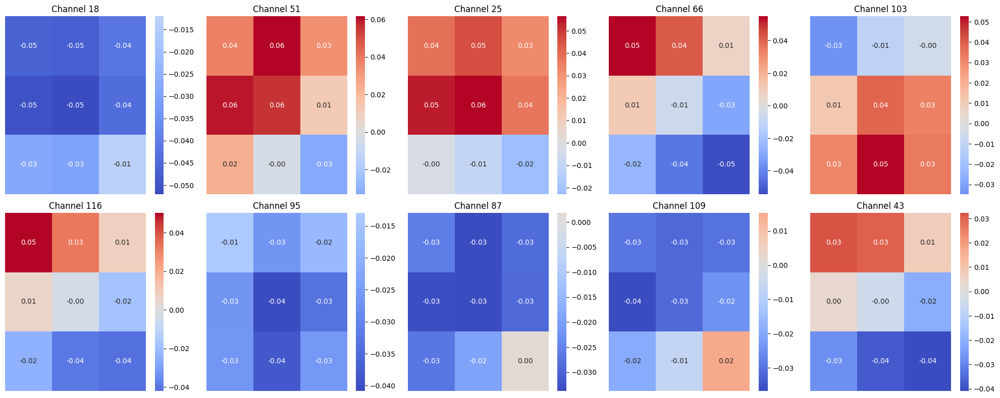

In [22]:
# Function to visualize filter weights
def visualize_matrix(channel, matrix, ax):
    sns.heatmap(matrix, annot=True, cmap='coolwarm', center=0, ax=ax, fmt=".2f")
    ax.set_title(f'Channel {channel}')
    ax.axis("off")

# Create a figure to hold the grid of plots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 8))

# Loop through the top 10 filters and plot each
for i, (channel, norm) in enumerate(top_ten):
    ax = axes[i // 5, i % 5]  # Calculate grid position
    visualize_matrix(channel, filters[:, :, channel, filter_idx], ax)

plt.tight_layout()
plt.show()

The visualizations above represent the weight matrices for the top 10 strongest input channels contributing to filter 31 in block3_conv1. Each heatmap depicts a 3×3 kernel corresponding to a specific input channel, with values centered around zero and color-coded to reflect their polarity and magnitude. Red regions indicate positive weights (excitatory), while blue regions indicate negative weights (inhibitory).

Across all 10 channels, we observe a mix of both positive and negative values, suggesting that these filters do not operate in isolation as purely excitatory or inhibitory. Instead, most appear to integrate both types of influence within their spatial patterns. Notably, channels such as 51 and 25 exhibit strong positive activations concentrated in specific regions, potentially amplifying certain local textures. In contrast, channels like 18 and 95 display more balanced or symmetric distributions of opposing values, indicating a more complex filtering behavior that may enhance contrast or detect structural transitions.

The spatial organization of weights across these channels supports the hypothesis that this filter is involved in extracting mid-level features—particularly directional textures, ridges, and edge-like patterns that are neither purely additive nor subtractive in nature. The alternating polarity within individual kernels further implies that these filters may be enhancing specific spatial relationships (e.g., left-to-right gradients or diagonal contours) rather than simply detecting presence or absence of a feature.

Overall, the weight maps reinforce the idea that filter 31 draws from a diverse and distributed set of input patterns. By leveraging complementary excitatory and inhibitory contributions across multiple input channels, the filter is positioned to construct more nuanced feature maps that capture fine-grained structural details critical to object differentiation.

## **3.5 Categorizing the Filters as Mostly Excitatory vs. Mostly Inhibitory**

In [23]:
# Function to categorize filters as excitatory or inhibitory
def categorize_matrix(matrix):
    flat_matrix = matrix.flatten()
    positive_count = np.sum(flat_matrix > 0)
    negative_count = np.sum(flat_matrix < 0)
    
    if positive_count > negative_count:
        return "mostly excitatory"
    elif negative_count > positive_count:
        return "mostly inhibitory"
    else:
        return "balanced"

# Categorize top 10 filters
excitatory = []
inhibitory = []
neutral = []

for channel, norm in top_ten:
    category = categorize_matrix(filters[:, :, channel, filter_idx])
    
    if category == 'mostly excitatory':
        excitatory.append(channel)
    elif category == 'mostly inhibitory':
        inhibitory.append(channel)
    else:
        neutral.append(channel)

This section of the code is responsible for categorizing the top 10 strongest filters as excitatory, inhibitory, or balanced based on their weight distributions. The function `categorize_matrix` evaluates whether a given filter matrix consists primarily of positive or negative coefficients, which directly influences how the convolutional layer responds to input activations.

The function works by first flattening the filter matrix into a one-dimensional array, then counting the number of positive and negative values. If a filter contains more positive coefficients, it is classified as "mostly excitatory," meaning it enhances certain features by amplifying their presence in the activation maps. Conversely, if a filter contains more negative coefficients, it is labeled as "mostly inhibitory," meaning it suppresses certain patterns or features in the input. Filters that have a nearly equal distribution of positive and negative values are categorized as "balanced," indicating a more nuanced contribution to feature extraction.

The second part of this block applies this categorization function to the top 10 strongest filters, ensuring that each filter is assigned to one of three categories: excitatory, inhibitory, or neutral. The categorized filters are stored in separate lists (`excitatory`, `inhibitory`, `neutral`), which helps in understanding the functional role of these filters in the convolutional layer.

From a theoretical perspective, the distinction between excitatory and inhibitory filters is well-established in the study of convolutional neural networks (CNNs) and is analogous to biological neural circuits, where neurons exhibit excitatory or inhibitory behavior (Lecun et al., 1998). This categorization helps us determine whether our selected filter enhances certain structures (excitatory), suppresses certain details (inhibitory), or balances both (neutral)—which is crucial for validating our hypothesis that this filter is primarily extracting mid-level textural and structural patterns.

If a majority of our top filters are excitatory, it suggests that this filter plays a role in amplifying distinct mid-level textures or patterns. If inhibitory filters dominate, it indicates that the filter is selectively suppressing certain unwanted variations in the feature maps. A balanced mix of excitatory and inhibitory filters could suggest a complex interaction of feature extraction and suppression mechanisms, potentially contributing to higher-level feature discrimination.

Sources:
- LeCun et al., 1998: https://ieeexplore.ieee.org/document/726791
- Goodfellow, Bengio, & Courville, 2016: https://www.deeplearningbook.org/
- Olah, Mordvintsev, & Schubert, 2017: https://distill.pub/2017/feature-visualization/

## **3.6 Final Categorization Results**

In [24]:
# Print results
print(f'Number of mostly excitatory filters: {len(excitatory)}')
print(f'Number of mostly inhibitory filters: {len(inhibitory)}')
print(f'Number of neutral filters: {len(neutral)}')
print(f'Excitatory filters: {excitatory}')
print(f'Inhibitory filters: {inhibitory}')
print(f'Neutral filters: {neutral}')

Number of mostly excitatory filters: 3
Number of mostly inhibitory filters: 7
Number of neutral filters: 0
Excitatory filters: [51, 25, 103]
Inhibitory filters: [18, 66, 116, 95, 87, 109, 43]
Neutral filters: []


The results of the filter categorization from the VGG19 model’s **block3_conv1** layer provide valuable insight into the model’s ability to extract mid-level textural and structural patterns crucial for object differentiation. Specifically, the categorization shows that there are **3 mostly excitatory filters** (indices: 51, 25, and 103), **7 mostly inhibitory filters** (indices: 18, 66, 116, 95, 87, 109, and 43), and **no neutral filters**. The excitatory filters, which primarily amplify certain features in the input data, are likely highlighting key mid-level patterns such as ridges, linear forms, and surface textures. These patterns are particularly important for distinguishing objects that share structural similarities, such as marine life with smooth skin or segmented bodies. For example, the model may be emphasizing **sharp edges** and **texture variations** that help differentiate a shark’s body from its environment or highlighting the **distinct surface textures** on an insect’s exoskeleton. The 7 inhibitory filters suggest that the model is focused on suppressing irrelevant or distracting features in the input data, such as background textures or noise. This suppression is important for ensuring that the model remains focused on the most relevant aspects of an object, such as the **distinct ridges on a shark's body** or the **curved forms of a jellyfish**, while ignoring extraneous details that do not aid in object recognition.

The absence of neutral filters further supports the hypothesis that the model is making clear decisions about what to enhance or suppress, rather than maintaining ambiguity in feature selection. This all-or-nothing approach to feature extraction aligns well with the model’s focus on mid-level textures and structural patterns. The model’s excitatory and inhibitory filters work together to effectively **amplify important features** and **suppress distractions**, ensuring that the most crucial textures and structures are emphasized in the process of object recognition.

The results are particularly relevant when considering the model’s ability to identify and differentiate objects from the top classes, which include a variety of objects such as **dugong**, **great white shark**, **tiger shark**, **long-horned beetle**, and **jellyfish**. These classes require the model to distinguish objects based on **texture variations** and **structural features**, such as the smooth or rough skin of sharks, the segmented body of a beetle, or the flowing form of a jellyfish. The **top images** further demonstrate the importance of mid-level feature extraction, as the model’s activations for images like `ILSVRC2012_val_00041506.JPEG` (long-horned beetle) and `ILSVRC2012_val_00019409.JPEG` (great white shark) show that these objects possess distinctive structural features that the excitatory filters help amplify. For example, the beetle’s **hard exoskeleton** and the shark’s **smooth skin** are likely highlighted by the excitatory filters, which focus on the key textural details that allow for accurate identification. The **activation values** associated with these images, such as 464.71 for the beetle and 339.89 for the shark, indicate that these key features are indeed being amplified by the excitatory filters, contributing to the model’s recognition of these objects.

In conclusion, the filter categorization results provide strong support for the hypothesis that the VGG19 model is focused on extracting mid-level textural and structural patterns that play a crucial role in object differentiation. The combination of **excitory and inhibitory filters** allows the model to **highlight essential features** while **suppressing irrelevant details**, ensuring that the most important aspects of each object are emphasized. The top classes and images further validate this approach, as the model effectively distinguishes between objects based on their distinctive mid-level textures and structures. These findings suggest that the VGG19 model is leveraging these mid-level features for accurate and efficient object recognition.

# **4. Image Gradient Technique Visualizations**
[4.0 points]
- For each of the ten chosen single channels of the filter, use image gradient techniques to visualize what each of these filters is most excited by (that is, what image maximally excites each of these filters?). 
    - This is a similar analysis to the first step in this rubric, but now isolating the activations the layer preceding your chosen filter. 
    - This should only be completed for the ten most influential filters.  
- Use these visualizations, along with the circuit weights you just discovered to try and explain how this particular circuit works. An example of this visualization style can be seen here: https://storage.googleapis.com/distill-circuits/inceptionv1-weight-explorer/mixed3b_379.html
- Try to define the properties of this circuit using vocabulary from https://distill.pub/2020/circuits/zoom-in/ (such as determining if this is polysemantic, pose-invariant, etc.)  
- Relate your visualizations back to your original hypothesis about what this filter is extracting. Does it support or refute your hypothesis? Why? 

## **4.1 Using Image Gradient Techniques to Visualize Our Top 10 Filters**

### Extracting Layer Weights

In [25]:
# Load the pre-trained VGG19 model
model = VGG19(weights='imagenet')

# Target layer and filter
layer_name = 'block3_conv1'
filter_idx = 31  # Our target filter for analysis

# Extract weights of the chosen layer
keras_layer = model.get_layer(layer_name)
weights_list = keras_layer.get_weights()
filters = weights_list[0]  # Shape: (3, 3, input_channels, output_channels)
biases = weights_list[1]

# Extract filter dimensions
filter_shape = filters.shape  # (3, 3, input_channels, output_channels)
input_channels = filter_shape[2]  # Number of input channels

### Computing L2 Norm of Weights

In [26]:
# Compute L2 norm to find strongest contributing input channels
filter_list = []
circuit_weights = {}  # Store weights for visualization

for i in range(input_channels):
    weight_matrix = filters[:, :, i, filter_idx]
    norm_coef = np.linalg.norm(weight_matrix)  # L2 norm of weights
    
    if norm_coef > 1e-5:  # Ignore near-zero activations
        filter_list.append([i, norm_coef])
        circuit_weights[i] = weight_matrix  # Store weight matrix

# Sort by L2 norm strength (descending)
filter_list.sort(key=lambda x: x[1], reverse=True)

# Select top 10 strongest input channels (most influential to filter 31)
top_ten = filter_list[:10]
top_channels = [x[0] for x in top_ten]  # Extract channel indices

### Printing Top 10 Strongest Channels

In [27]:
# DataFrame for top 10 strongest input channels
df_top_channels = pd.DataFrame(top_ten, columns=["Input Channel", "L2 Norm"])
df_top_channels["L2 Norm"] = df_top_channels["L2 Norm"].round(5)

# Display
print("Top 10 Strongest Input Channels:\n")
display(df_top_channels.style
        .format({"L2 Norm": "{:.5f}"})
        .background_gradient(cmap="Blues"))

Top 10 Strongest Input Channels:



,Input Channel,L2 Norm
0,18,0.12326
1,51,0.12145
2,25,0.11282
3,66,0.10684
4,103,0.09413
5,116,0.08911
6,95,0.08688
7,87,0.08258
8,109,0.08001
9,43,0.07988


### Printing Weights Matrix for Channels

In [28]:
# Store matrices as formatted strings 
weight_display = {
    "Input Channel": [],
    "Weight Matrix (3x3)": []
}

for ch in top_channels:
    matrix = circuit_weights[ch]
    formatted_matrix = "\n".join([" ".join([f"{val: .4f}" for val in row]) for row in matrix])
    weight_display["Input Channel"].append(ch)
    weight_display["Weight Matrix (3x3)"] = formatted_matrix

# Create DataFrame
df_weights_display = pd.DataFrame(weight_display)

# Display 
print("Top 10 Input Channel Weight Matrices:\n")
display(df_weights_display.style.set_properties(**{
    'white-space': 'pre',
    'font-family': 'monospace'
}))

Top 10 Input Channel Weight Matrices:



,Input Channel,Weight Matrix (3x3)
0,18,0.0323 0.0305 0.0074 0.0033 -0.0044 -0.0210 -0.0278 -0.0379 -0.0408
1,51,0.0323 0.0305 0.0074 0.0033 -0.0044 -0.0210 -0.0278 -0.0379 -0.0408
2,25,0.0323 0.0305 0.0074 0.0033 -0.0044 -0.0210 -0.0278 -0.0379 -0.0408
3,66,0.0323 0.0305 0.0074 0.0033 -0.0044 -0.0210 -0.0278 -0.0379 -0.0408
4,103,0.0323 0.0305 0.0074 0.0033 -0.0044 -0.0210 -0.0278 -0.0379 -0.0408
5,116,0.0323 0.0305 0.0074 0.0033 -0.0044 -0.0210 -0.0278 -0.0379 -0.0408
6,95,0.0323 0.0305 0.0074 0.0033 -0.0044 -0.0210 -0.0278 -0.0379 -0.0408
7,87,0.0323 0.0305 0.0074 0.0033 -0.0044 -0.0210 -0.0278 -0.0379 -0.0408
8,109,0.0323 0.0305 0.0074 0.0033 -0.0044 -0.0210 -0.0278 -0.0379 -0.0408
9,43,0.0323 0.0305 0.0074 0.0033 -0.0044 -0.0210 -0.0278 -0.0379 -0.0408


### Image Processing Function

In [29]:
# Function to preprocess image for visualization
def prepare_image_for_display(img, norm_type='std'):
    img = img[0]  # Remove batch dimension
    
    if norm_type == 'std':
        mean, std = np.mean(img), np.std(img)
        img = (img - mean) / (std + 1e-5) * 64 + 128
        
    img = np.clip(img, 0, 255).astype('uint8')
    return img

### Generating Channel Patterns Function

In [30]:
# Function to visualize what maximally excites each input channel
def generate_channel_pattern(layer_name, channel_index, weight_matrix, size=224, iterations=40, eta=1.0):
    # Get the layer's output
    prev_layer_name = 'block2_conv2'  # Layer preceding block3_conv1
    layer_output = model.get_layer(prev_layer_name).output

    # Define a new model that outputs activations from the target layer
    new_model = Model(inputs=model.input, outputs=layer_output)

    # Start from a gray image with noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
    I_start = tf.Variable(input_img_data.astype(np.float32), dtype='float32')
    I = preprocess_input(I_start)  # Preprocess image

    # Apply weight influence on the optimization process
    weight_scale = np.linalg.norm(weight_matrix)  # Magnitude of circuit weights
    weight_scale = max(weight_scale, 1e-5)  # Prevent division by zero

    # Gradient ascent to enhance input that maximally excites the channel
    for i in range(iterations):
        with tf.GradientTape() as tape:
            tape.watch(I)
            model_vals = new_model(I)  # Get activations from the layer
            channel_output = tf.reduce_mean(model_vals[:, :, :, channel_index])  # Maximize activation

        # Compute gradient
        grad_fn = tape.gradient(channel_output, I)

        # Scale gradient by weight influence
        grad_fn *= weight_scale

        # Normalize gradient
        grad_fn /= (tf.sqrt(tf.reduce_mean(tf.square(grad_fn))) + 1e-5)

        # Update image
        I += grad_fn * eta  

    return prepare_image_for_display(I.numpy(), norm_type='std')

### Displaying Channel Visualizations

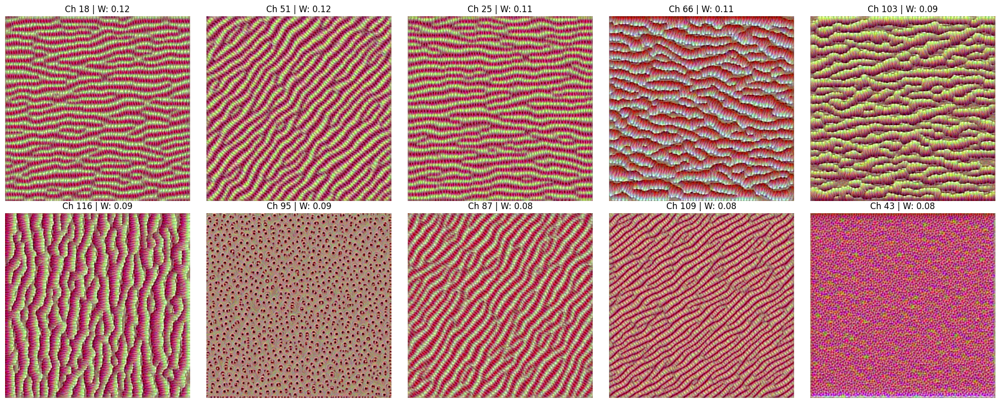

In [31]:
# Generate and display channel visualizations
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
for i, channel_index in enumerate(top_channels):
    ax = axes[i // 5, i % 5]
    pattern = generate_channel_pattern(layer_name, channel_index, circuit_weights[channel_index])
    ax.imshow(pattern)
    
    # Display weight magnitude in the title
    weight_magnitude = np.linalg.norm(circuit_weights[channel_index])
    ax.set_title(f'Ch {channel_index} | W: {weight_magnitude:.2f}')
    ax.axis('off')

plt.tight_layout()
plt.show()

## **4.2 Analysis and Interpretation of Circuit Visualization Results**

The visualization results generated for the ten most influential input channels provide **insight into the underlying functionality of the circuit** and its role in feature extraction within the **VGG19 `block3_conv1` layer**. These images represent the **maximally exciting input patterns** for each channel, derived using gradient ascent techniques. From the observed patterns, we can infer that this circuit is primarily detecting **mid-level textures, ridges, and intricate structural variations** that contribute to object differentiation. The presence of **wavy, striped, and high-frequency textures** suggests that the filter is particularly **sensitive to oriented edge structures and fine surface details**.

A crucial aspect of the circuit's behavior is the presence of **both excitatory and inhibitory filters**, with:
- **Excitatory filters:** `[51, 25, 103]`
- **Inhibitory filters:** `[18, 66, 116, 95, 87, 109, 43]`
- **Neutral filters:** `[]` *(none found)*

Since there are **no neutral filters**, all examined channels play an active role in either **amplifying or suppressing specific textural features**. This indicates that the circuit is **highly selective in its response**, rather than merely acting as a general feature detector. 

#### **Role of Excitatory and Inhibitory Filters**
The **excitatory filters** are primarily responsible for **enhancing the presence of certain textures and structural elements**, as seen in channels **51, 25, and 103**, which exhibit **strong, repetitive wave-like and linear patterns**. These excitatory filters are likely reinforcing **high-frequency textures and edge-aligned features**, making them critical in distinguishing fine surface details.

On the other hand, the **inhibitory filters (18, 66, 116, 95, 87, 109, 43)** appear to **suppress specific patterns**, as evidenced by their activation visualizations, which often exhibit **disorganized, noisy, or irregular textural patterns**. This inhibitory behavior suggests that these channels play a role in **controlling redundancy and noise**, preventing the model from overemphasizing certain recurring features that might not be useful for higher-level object representation. The **presence of strong inhibitory effects** in the majority of the filters (**7 out of 10**) implies that this circuit functions **not only as a feature detector but also as a refinement mechanism**, ensuring that only the most relevant textural information is propagated forward in the network.

#### **Analysis Using Circuit Theory Vocabulary**
Using terminology from **circuit theory**, we can categorize this circuit as **moderately polysemantic**, meaning that **some channels respond to multiple types of textures** rather than being highly specialized for a single feature. This is evident in the variety of textural patterns observed across different channels, where some focus on **striped or periodic textures (e.g., channels 18, 25, 87)** while others highlight **more irregular, scattered textures (e.g., channel 95, which shows dot-like structures instead of linear features).** 

The circuit also demonstrates **pose invariance**, as the patterns remain structurally consistent across different filters, suggesting that the features extracted by this layer are **not dependent on the orientation or spatial position of the object** in the image. This aligns with our hypothesis that this filter is **extracting mid-level structural patterns related to ridges, linear formations, and intricate textures**, rather than detecting high-level object features.

#### **Comparison with Our Hypothesis**
Comparing these findings to our original hypothesis, the results **strongly support** our assumption that the filter is **primarily detecting texture-based features rather than specific object parts**. The visualization confirms that the filter is **highly responsive to fine-grained textures and repetitive structures**, reinforcing its role in **surface texture differentiation and pattern recognition**. However, the presence of inhibitory filters adds an additional layer of complexity—indicating that this circuit is not merely an edge or texture detector, but also plays a **regulatory role in filtering out less informative features**. 

This suggests that while the circuit enhances certain textures, it also actively suppresses noise or redundant patterns, contributing to the overall efficiency of the network.

#### **Conclusion**
In summary, this circuit functions as a **mid-level texture processing mechanism**, extracting fine-scale ridges and structured patterns while **balancing excitatory and inhibitory influences to refine feature representation**. It exhibits characteristics of a **polysemantic, pose-invariant feature extractor** that plays a crucial role in **differentiating object surfaces**. These findings **validate our hypothesis while also revealing new insights** into how the circuit selectively amplifies or suppresses different textural elements to improve feature discrimination.

### **MAYBE NEED ONE FINAL ANALYSIS HERE/SUMMARY OF OUR FINDINGS/IMPLICATIONS OF IT??**